# NGC 4380 Analysis

Isaac Cheng - October 2021

This is meant to be a compilation/walkthrough of how to generate many of the different
plots and data products related to the analysis of a galaxy using NGVS and VERTICO data.
Additionally, this notebook can act as a template for the analysis of other galaxies.

Note that these cells should be run sequentially, as subsequent cells may rely on data
from previous cells. I have tried my best to keep each section as self-contained as
possible, but there are some cells which would be impractical to run every time.

Finally, throughout all of these analyses, we assume a distance of 16.5 Mpc (the distance
to the centre of the Virgo cluster) with a 10% distance uncertainty. This distance
uncertainty is a systematic error and does not affect our analyses or interpretation of
the resolved data. Thus, unless specifically noted, all derived uncertainties only include
random errors and do not account for the distance uncertainty.


# Generating CO contour plots


In [1]:
# Need to switch directories if using VS Code + sshfs
galaxy = "NGC4380"
galpath = f"/arc/home/IsaacCheng/coop_f2021/galaxies/{galaxy}/"
%cd "$galpath"
# 
import astropy.units as u
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
# 
# Load my own packages
# 
import sys
sys.path.append("/arc/home/IsaacCheng/coop_f2021/packages")
import radial_profile_utils as rpu
import plot_utils as pu
# Reload my packages
import importlib
importlib.reload(rpu)
importlib.reload(pu)

/arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380


<module 'plot_utils' from '/arc/home/IsaacCheng/coop_f2021/packages/plot_utils.py'>

## Gas surface density maps


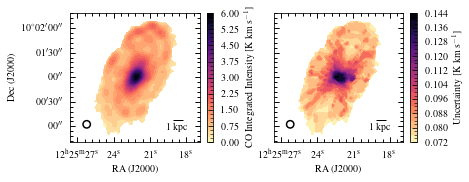

In [2]:
#
# Load CO integrated intensity (surface brightness) data
#
# 9 arcsec beam, 2 arcsec pixels. Units of K.km/s
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_Kkms-1.fits"
Ico_unc_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_unc.fits"  # uncertainty
Ico_data, co_header = fits.getdata(Ico_path, header=True)
Ico_unc = fits.getdata(Ico_unc_path)  # uncertainty
co_wcs = WCS(co_header)
galdist = 16.5 * u.Mpc  # distance to centre of Virgo cluster. Assume 10% uncertainty
# Mask background
Ico_mask = (~np.isfinite(Ico_unc)) | (Ico_unc <= 0)
Ico_data[Ico_mask] = np.nan
Ico_unc[Ico_mask] = np.nan
# #
# # Plot (2 separate plots)
# #
# # Data
# fig, ax = plt.subplots(subplot_kw={"projection": co_wcs})
# img = ax.contourf(Ico_data, cmap="magma_r", levels=22, vmin=0)
# cbar = fig.colorbar(img)
# cbar.set_label(r"CO Integrated Intensity ($\rm K\; km\; s^{-1}$)")
# ax.set_aspect("equal")
# ax.set_xlabel("RA (J2000)")
# ax.set_ylabel("Dec (J2000)")
# ax.grid(False)
# plt.show()
# # Uncertainty
# fig, ax = plt.subplots(subplot_kw={"projection": co_wcs})
# img = ax.contourf(Ico_unc, cmap="magma_r", levels=22)
# cbar = fig.colorbar(img)
# cbar.set_label(r"CO Integrated Intensity Uncertainty ($\rm K\; km\; s^{-1}$)")
# ax.set_aspect("equal")
# ax.set_xlabel("RA (J2000)")
# ax.set_ylabel("Dec (J2000)")
# ax.grid(False)
# plt.show()
#
# Plot (1 plot)
#
fig, (ax1, ax2) = plt.subplots(
    nrows=1, ncols=2, subplot_kw={"projection": co_wcs}, sharey=True
)
# Data
img1 = ax1.contourf(Ico_data, cmap="magma_r", levels=22, vmin=0)
cbar1 = fig.colorbar(img1, ax=ax1, fraction=0.045)
cbar1.set_label(r"CO Integrated Intensity [$\rm K\; km\; s^{-1}$]")
ax1.set_aspect("equal")
ax1.set_xlabel("RA (J2000)")
ax1.set_ylabel("Dec (J2000)")
ax1.grid(False)
# Noise
img2 = ax2.contourf(Ico_unc, cmap="magma_r", levels=22)
cbar2 = fig.colorbar(img2, ax=ax2, fraction=0.045)
cbar2.set_label(r"Uncertainty [$\rm K\; km\; s^{-1}$]")
ax2.set_aspect("equal")
ax2.set_xlabel("RA (J2000)")
ax2.coords[1].set_ticklabel_visible(False)  # Hide y-axis tick label
ax2.grid(False)
# Add artists
pu.add_scalebar(ax1, co_wcs, dist=galdist)
pu.add_scalebar(ax2, co_wcs, dist=galdist)
pu.add_beam(ax1, co_header, xy=(10, 11), edgecolor="k", fc="None", lw=1.5, zorder=2)
pu.add_beam(ax2, co_header, xy=(10, 11), edgecolor="k", fc="None", lw=1.5, zorder=2)
# 
fig.tight_layout(pad=2)
# fig.savefig(galpath + f"{galaxy}_Kkms.pdf")
plt.show()

To convert from integrated intensity ($\rm k\, km\, s^{-1}$) to stellar mass density, we
apply Eq. (7) of Brown et al. (2021):

$$\rm \Sigma_{mol} = \frac{\alpha_{co}}{R_{21}} I_{CO}$$

where $\rm I_{CO}$ is the CO(1-0) line intensity (units of $\rm k\, km\, s^{-1}$),
$\rm \alpha_{CO}=4.35\, M_\odot\, pc^{-2} (K\, km\, s^{-1})^{-1}$ is the molecular gas mass
to CO(1-0) ratio (see Bolatto et al., 2013), and $R_{21}=0.8$ is the CO(2-1)/CO(1-0) line
ratio.

Note that molecular gas estimates derived using the formula above indicate the *total*
molecular gas mass (i.e., including the ~36% contribution of helium).

The following uses VERTICO's 9 arcsec beam, 2 arcsec pixels data, but this applies to other
data products, too (e.g., Nyquist resolution with 4 arcsec pixels)

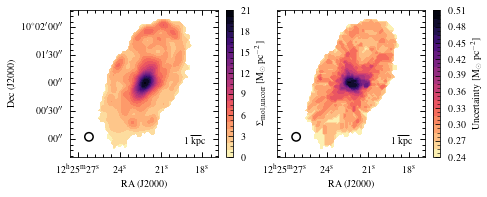

In [3]:
# 
# Convert to gas surface density
# 
alpha_co = 4.35  # M_sun/pc^2 per (K km/s)
R_21 = 0.8  # dimensionless. CO(2-1)/CO(1-0) ratio
gas_density_uncorr = alpha_co * R_21 * Ico_data
gas_density_err_uncorr = alpha_co * R_21 * Ico_unc
# 
# Plot
# 
fig, (ax1, ax2) = plt.subplots(
    nrows=1, ncols=2, subplot_kw={"projection": co_wcs}, sharey=True
)
# Data
img1 = ax1.contourf(gas_density_uncorr, cmap="magma_r", levels=22, vmin=0)
cbar1 = fig.colorbar(img1, ax=ax1, fraction=0.045)
cbar1.set_label(r"$\rm \Sigma_{mol, uncorr}$ [$\rm M_\odot\; pc^{-2}$]")
ax1.set_aspect("equal")
ax1.set_xlabel("RA (J2000)")
ax1.set_ylabel("Dec (J2000)")
ax1.grid(False)
# Noise
img2 = ax2.contourf(gas_density_err_uncorr, cmap="magma_r", levels=22)
cbar2 = fig.colorbar(img2, ax=ax2, fraction=0.045)
cbar2.set_label(r"Uncertainty [$\rm M_\odot\; pc^{-2}$]")
ax2.set_aspect("equal")
ax2.set_xlabel("RA (J2000)")
ax2.coords[1].set_ticklabel_visible(False)  # Hide y-axis tick label
ax2.grid(False)
# Add artists
pu.add_scalebar(ax1, co_wcs, dist=galdist)
pu.add_scalebar(ax2, co_wcs, dist=galdist)
pu.add_beam(ax1, co_header, xy=(10, 11), edgecolor="k", fc="None", lw=1.5, zorder=2)
pu.add_beam(ax2, co_header, xy=(10, 11), edgecolor="k", fc="None", lw=1.5, zorder=2)
# 
fig.tight_layout()
# fig.savefig(galpath + f"{galaxy}_gasDensity_uncorr.pdf")
plt.show()

Since CO is optically thick, we need to correct for the inclination when estimating the
gas mass/density since the telescope calibration assume the target is face-on. This allows
us to make a better "apples-to-apples" comparison. Note that we don't need to correct the
inclination for optical data since the stellar disk is optically thin (hence why we can
see the background galaxy in the optical plots below). We also do not correct the "raw"
surface brightness data (units of $\rm K\, km\, s^{-1}$) since these are our measurements.

To correct any quantity for inclination, simply multiply the quantity by the cosine of its
inclination ($i$). For example,

$$\mathrm{\Sigma_{mol, corr} = \Sigma_{mol}} \times \cos(i) =
\mathrm{\frac{\alpha_{co}}{R_{21}} I_{CO}} \times \cos(i)$$

If $i \geq i_{\rm threshold}$, then multiply by $i_{\rm threshold}$ instead. In Brown et al.
(2021), they use $i_{\rm threshold} = 80^\circ$


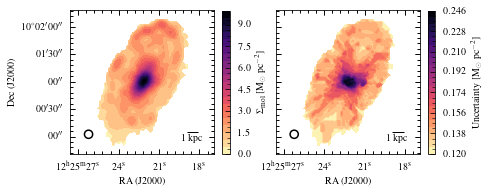

In [4]:
# 
# Correct for inclination
# 
inclination = 61  # degrees. From Table 1 of Brown et al. (2021)
gas_density = rpu.correct_for_i(
    gas_density_uncorr, inclination, i_threshold=80, i_replacement=80
)
gas_density_err = rpu.correct_for_i(
    gas_density_err_uncorr, inclination, i_threshold=80, i_replacement=80
)
# cos_i = np.cos(np.deg2rad(inclination))
# gas_density = gas_density_uncorr * cos_i
# gas_density_err = gas_density_err_uncorr * cos_i
# 
# Plot
# 
fig, (ax1, ax2) = plt.subplots(
    nrows=1, ncols=2, subplot_kw={"projection": co_wcs}, sharey=True
)
# Data
img1 = ax1.contourf(gas_density, cmap="magma_r", levels=22, vmin=0)
cbar1 = fig.colorbar(img1, ax=ax1, fraction=0.045)
cbar1.set_label(r"$\rm \Sigma_{mol}$ [$\rm M_\odot\; pc^{-2}$]")
ax1.set_aspect("equal")
ax1.set_xlabel("RA (J2000)")
ax1.set_ylabel("Dec (J2000)")
ax1.grid(False)
# Noise
img2 = ax2.contourf(gas_density_err, cmap="magma_r", levels=22)
cbar2 = fig.colorbar(img2, ax=ax2, fraction=0.045)
cbar2.set_label(r"Uncertainty [$\rm M_\odot\; pc^{-2}$]")
ax2.set_aspect("equal")
ax2.set_xlabel("RA (J2000)")
ax2.coords[1].set_ticklabel_visible(False)  # Hide y-axis tick label
ax2.grid(False)
# Add artists
pu.add_scalebar(ax1, co_wcs, dist=galdist)
pu.add_scalebar(ax2, co_wcs, dist=galdist)
pu.add_beam(ax1, co_header, xy=(10, 11), edgecolor="k", fc="None", lw=1.5, zorder=2)
pu.add_beam(ax2, co_header, xy=(10, 11), edgecolor="k", fc="None", lw=1.5, zorder=2)
# 
fig.tight_layout()
# fig.savefig(galpath + f"{galaxy}_gasDensity_corr.pdf")
plt.show()

### Gas Surface Density Maps for Beamer Slides


/opt/conda/lib/python3.8/contextlib.py:113: UserWarning: Style includes a parameter, 'backend', that is not related to style.  Ignoring
  return next(self.gen)


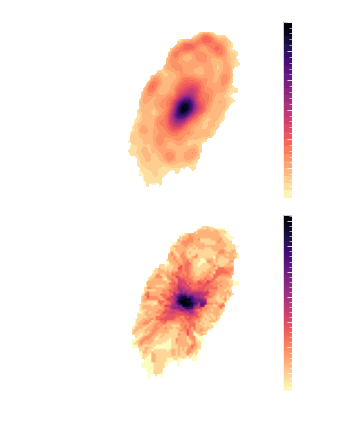

In [40]:
#
# Load CO integrated intensity (surface brightness) data
#
# 9 arcsec beam, 2 arcsec pixels. Units of K.km/s
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_Kkms-1.fits"
Ico_unc_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_unc.fits"  # uncertainty
Ico_data, co_header = fits.getdata(Ico_path, header=True)
Ico_unc = fits.getdata(Ico_unc_path)  # uncertainty
co_wcs = WCS(co_header)
galdist = 16.5 * u.Mpc  # distance to centre of Virgo cluster. Assume 10% uncertainty
# Mask background
Ico_mask = (~np.isfinite(Ico_unc)) | (Ico_unc <= 0)
Ico_data[Ico_mask] = np.nan
Ico_unc[Ico_mask] = np.nan
#
# Plot (vertically stacked plots)
#
with plt.style.context("/arc/home/IsaacCheng/coop_f2021/stylesheets/beamer.mplstyle"):
    my_cmap = mpl.cm.get_cmap("magma_r").copy()
    my_cmap.set_bad(alpha=0)  # transparent NaNs
    # Data
    fig, (ax1, ax2) = plt.subplots(
        nrows=2, ncols=1, figsize=mpl.figure.figaspect(1.7),
        subplot_kw={"projection": co_wcs}, sharex=True
    )
    img1 = ax1.contourf(Ico_data, cmap=my_cmap, levels=22, vmin=0)
    cbar1 = fig.colorbar(img1, ax=ax1, fraction=0.045, format=mpl.ticker.FormatStrFormatter("%.2f"))
    cbar1.set_label(r"CO Integrated Intensity ($\rm K\; km\; s^{-1}$)")
    cbar1.set_ticks(np.arange(0, 7, 1))
    pu.add_scalebar(ax1, co_wcs, dist=galdist, color="w")
    pu.add_scalebeam(ax1, co_header, ec="w", lw=2)
    ax1.set_aspect("equal")
    ax1.coords[0].set_ticklabel_visible(False)  # Hide x-axis tick label
    ax1.set_ylabel("Dec (J2000)")
    ax1.grid(False)
    # Uncertainty
    img2 = ax2.imshow(Ico_unc, cmap=my_cmap)
    cbar2 = fig.colorbar(img2, ax=ax2, fraction=0.045)
    cbar2.set_label(r"Uncertainty ($\rm K\; km\; s^{-1}$)")
    pu.add_scalebar(ax2, co_wcs, dist=galdist, color="w")
    pu.add_scalebeam(ax2, co_header, ec="w", lw=2)
    ax2.set_aspect("equal")
    ax2.set_xlabel("RA (J2000)")
    ax2.set_ylabel("Dec (J2000)")
    ax2.grid(False)
    plt.subplots_adjust(hspace=0.1)
    # fig.savefig(galpath + f"{galaxy}_Kkms_beamer.pdf")
    plt.show()

/opt/conda/lib/python3.8/contextlib.py:113: UserWarning: Style includes a parameter, 'backend', that is not related to style.  Ignoring
  return next(self.gen)


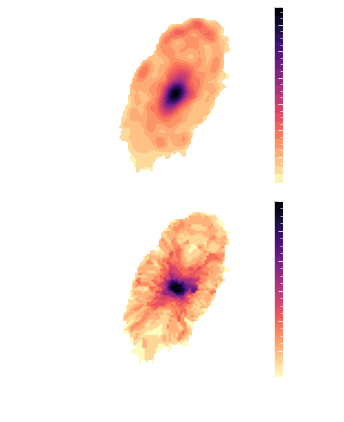

In [20]:
# 
# Convert to gas surface density
# 
alpha_co = 4.35  # M_sun/pc^2 per (K km/s)
R_21 = 0.8  # dimensionless. CO(2-1)/CO(1-0) ratio
gas_density_uncorr = alpha_co * R_21 * Ico_data
gas_density_err_uncorr = alpha_co * R_21 * Ico_unc
# 
# Correct for inclination
# 
inclination = 61  # degrees. From Table 1 of Brown et al. (2021)
gas_density = rpu.correct_for_i(
    gas_density_uncorr, inclination, i_threshold=80, i_replacement=80
)
gas_density_err = rpu.correct_for_i(
    gas_density_err_uncorr, inclination, i_threshold=80, i_replacement=80
)
#
# Plot (vertically stacked plots)
#
with plt.style.context("/arc/home/IsaacCheng/coop_f2021/stylesheets/beamer.mplstyle"):
    my_cmap = mpl.cm.get_cmap("magma_r").copy()
    my_cmap.set_bad(alpha=0)  # transparent NaNs
    # Data
    fig, (ax1, ax2) = plt.subplots(
        nrows=2, ncols=1, figsize=mpl.figure.figaspect(1.7),
        subplot_kw={"projection": co_wcs}, sharex=True
    )
    img1 = ax1.contourf(gas_density, cmap=my_cmap, levels=22, vmin=0)
    cbar1 = fig.colorbar(img1, ax=ax1, fraction=0.045)
    cbar1.set_label(r"$\rm \Sigma_{mol}$ [$\rm M_\odot\; pc^{-2}$]")
    # cbar1 = fig.colorbar(img1, ax=ax1, fraction=0.045, format=mpl.ticker.FormatStrFormatter("%.2f"))
    pu.add_scalebar(ax1, co_wcs, dist=galdist, color="w")
    pu.add_scalebeam(ax1, co_header, ec="w", lw=2)
    ax1.set_aspect("equal")
    ax1.coords[0].set_ticklabel_visible(False)  # Hide x-axis tick label
    ax1.set_ylabel("Dec (J2000)")
    ax1.grid(False)
    # Uncertainty
    img2 = ax2.imshow(gas_density_err, cmap=my_cmap)
    cbar2 = fig.colorbar(img2, ax=ax2, fraction=0.045)
    cbar2.set_label(r"Uncertainty [$\rm M_\odot\; pc^{-2}$]")
    pu.add_scalebar(ax2, co_wcs, dist=galdist, color="w")
    pu.add_scalebeam(ax2, co_header, ec="w", lw=2)
    ax2.set_aspect("equal")
    ax2.set_xlabel("RA (J2000)")
    ax2.set_ylabel("Dec (J2000)")
    ax2.grid(False)
    plt.subplots_adjust(hspace=0.1)
    # fig.savefig(galpath + f"{galaxy}_gasDensity_corr_beamer.pdf")
    plt.show()

# RGB Image

Produce a qualitative, median-normalized, log-scale RGB image for fun!


In [3]:
# Need to switch directories if using VS Code + sshfs
galaxy = "NGC4380"
galpath = f"/arc/home/IsaacCheng/coop_f2021/galaxies/{galaxy}/"
%cd "$galpath"
# 
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
# 
# Load my own packages
# 
import sys
sys.path.append("/arc/home/IsaacCheng/coop_f2021/packages")
import fits_utils as fu
import plot_utils as pu
# Reload my packages
import importlib
importlib.reload(fu)
importlib.reload(pu)

/arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380


<module 'plot_utils' from '/arc/home/IsaacCheng/coop_f2021/packages/plot_utils.py'>

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


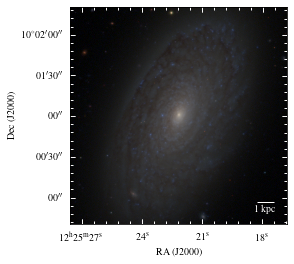

In [5]:
galdist = 16.5 * u.Mpc  # distance to centre of Virgo cluster. Assume 10% uncertainty
#
# Load data
# N.B. Need to update NGVS paths
# 
# 2 arcsec pixel CO data (purely to cutout optical data to match CO data)
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_Kkms-1.fits"
Ico_data, co_header = fits.getdata(Ico_path, header=True)
co_wcs = WCS(co_header)
# "red" channel (i-band)
iband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.i.Mg004.3136_8588_6905_10184.fits"
# "green" channel (g-band)
gband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.g.Mg004.3136_8588_6905_10184.fits"
# "blue" channel (u-band)
uband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.u.Mg004.3136_8588_6905_10184.fits"
iband_data_uncut, iband_header_uncut = fits.getdata(iband_path, header=True)
gband_data_uncut, gband_header_uncut = fits.getdata(gband_path, header=True)
uband_data_uncut, uband_header_uncut = fits.getdata(uband_path, header=True)
# 
# Cutout optical data to extent of CO data (optional)
# 
iband_data, iband_wcs = fu.cutout_to_target(
    iband_data_uncut, WCS(iband_header_uncut), Ico_data, co_wcs
)
gband_data, gband_wcs = fu.cutout_to_target(
    gband_data_uncut, WCS(gband_header_uncut), Ico_data, co_wcs
)
uband_data, uband_wcs = fu.cutout_to_target(
    uband_data_uncut, WCS(uband_header_uncut), Ico_data, co_wcs
)
# 
# Median-normalize data on a logarithmic scale and make RGB array
# 
rgb_data = pu.lognorm_median(iband_data, gband_data, uband_data, a=1000, norm_factor=1000)
# 
# Plot
# 
fig, ax = plt.subplots(subplot_kw={"projection": uband_wcs})
ax.imshow(rgb_data, interpolation="none")
ax.tick_params(color="w")
pu.add_scalebar(ax, uband_wcs, dist=galdist, color="w")
ax.set_xlabel("RA (J2000)")
ax.set_ylabel("Dec (J2000)")
ax.grid(False)
fig.savefig(galpath + f"{galaxy}_rgb.pdf")
plt.show()

# Major Axis Colour Profile

Generate a line profile (e.g., of the g-i colours) along the major axis of NGC 4380. The
function below uses nearest-neighbour sampling and *no smoothing is applied*. Finally,
note that the user must specify a start and end point. The `extend` keyword (which, if
given two points, automatically extends the line profile to the edges of the plot) is not
yet implemented!


In [1]:
# Need to switch directories if using VS Code + sshfs
galaxy = "NGC4380"
galpath = f"/arc/home/IsaacCheng/coop_f2021/galaxies/{galaxy}/"
%cd "$galpath"
# 
import astropy.units as u
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits
from astropy.wcs import WCS
# 
# Load my own packages
# 
import sys
sys.path.append("/arc/home/IsaacCheng/coop_f2021/packages")
import fits_utils as fu
import plot_utils as pu
# Reload my packages
import importlib
importlib.reload(fu)
importlib.reload(pu)

/arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380


<module 'plot_utils' from '/arc/home/IsaacCheng/coop_f2021/packages/plot_utils.py'>

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
/arc/home/IsaacCheng/coop_f2021/packages/fits_utils.py:267: RuntimeWarning: invalid value encountered in log10
  return -2.5 * np.log10(blue / red)


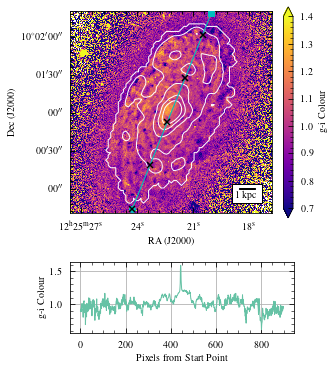

In [2]:
galdist = 16.5 * u.Mpc  # distance to centre of Virgo cluster. Assume 10% uncertainty
pa = 158  # position angle, degrees. From Table 1 of Brown et al. (2021)
          # N.B. pa starts at North and increases East (CCW)
#
# Load data
# N.B. Need to update NGVS paths
# 
# 2 arcsec pixel CO data (purely to cutout optical data to match CO data)
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_Kkms-1.fits"
Ico_data, co_header = fits.getdata(Ico_path, header=True)
co_wcs = WCS(co_header)
# Optical data
iband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.i.Mg004.3136_8588_6905_10184.fits"
gband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.g.Mg004.3136_8588_6905_10184.fits"
iband_data_uncut, iband_header_uncut = fits.getdata(iband_path, header=True)
gband_data_uncut, gband_header_uncut = fits.getdata(gband_path, header=True)
# 
# Cutout optical data to extent of CO data (optional)
# 
iband_data, iband_wcs = fu.cutout_to_target(
    iband_data_uncut, WCS(iband_header_uncut), Ico_data, co_wcs
)
gband_data, gband_wcs = fu.cutout_to_target(
    gband_data_uncut, WCS(gband_header_uncut), Ico_data, co_wcs
)
# 
# Calculate g-i colour
# 
gi_colour = fu.calc_colour(gband_data, iband_data)
# 
# Generate major axis profile
# 
start = np.array([264, 19])
direction = np.array([np.cos(np.deg2rad(pa + 90)), np.sin(np.deg2rad(pa + 90))]) * -1
num_px = 901
stop = np.array(direction * num_px + start).astype(int)
gi_profile, gi_profile_x, gi_profile_y = fu.line_profile(gi_colour, start, stop)
# 
# Plot
# 
fig = plt.figure(figsize=mpl.figure.figaspect(1.5))
# 
# Image of galaxy
# 
ax1 = fig.add_subplot(3, 1, (1, 2), projection=gband_wcs)
img1 = ax1.imshow(gi_colour, interpolation="none", cmap="plasma", vmin=0.7, vmax=1.4)
cbar1 = fig.colorbar(img1, fraction=0.045, extend="both")
cbar1.set_label("g-i Colour")
# Add CO contour
ax1.contour(
    Ico_data,
    transform=ax1.get_transform(co_wcs),
    levels=range(5),
    colors="w",
    linewidths=1,
)
# Add line showing line profile
ax1.plot(gi_profile_x, gi_profile_y, "c-", lw=1)
ax1.plot(*start, "co", label="Start")  # circle
ax1.plot(*stop, "cs", label="End")  # square
# Tick marks along line
ax1.plot(
    gi_profile_x[::200], gi_profile_y[::200], "kx", markersize=6, markeredgewidth=1.5
)
# 
pu.add_scalebar(ax1, gband_wcs, dist=galdist, frameon=True, pad=0.4, borderpad=1)
ax1.set_xlabel("RA (J2000)")
ax1.set_ylabel("Dec (J2000)")
ax1.grid(False)
# 
# Line profile
# 
ax2 = fig.add_subplot(414)
ax2.plot(gi_profile, lw=1)
ax2.set_ylabel("g-i Colour")
ax2.set_xlabel("Pixels from Start Point")
# 
# fig.savefig(galpath + f"{galaxy}_gi_profile.pdf")
plt.show()

# Bin NGVS Data (1. to specific extent & resolution, 2. using adaptive binning)


In [1]:
# Need to switch directories if using VS Code + sshfs
galaxy = "NGC4380"
galpath = f"/arc/home/IsaacCheng/coop_f2021/galaxies/{galaxy}/"
%cd "$galpath"
# 
import astropy.units as u
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import reproject
from astropy.io import fits
from astropy.wcs import WCS
# 
# Load my own packages
# 
import sys
sys.path.append("/arc/home/IsaacCheng/coop_f2021/packages")
import fits_utils as fu
import fits_utils_old as fuo
import plot_utils as pu
# Reload my packages
import importlib
importlib.reload(fu)
importlib.reload(fuo)
importlib.reload(pu)

/arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380


<module 'plot_utils' from '/arc/home/IsaacCheng/coop_f2021/packages/plot_utils.py'>

## 1. Regular binning procedure

1. Cut out the optical data to the radio data's extent. Remember to modify the WCS object.
2. Reproject the optical image (while preserving flux) so that its dimensions are integer
   multiples of the radio data's dimensions. Furthermore, the new dimensions should
   satisfy the above criterion while being as close as possible to the cutout's original
   dimensions. (This is because reprojection tries to preserve the pixel values as much as
   possible, regardless of the new dimensions.) Remember to modify the WCS object
   (tricky!).
3. Bin the reprojected optical image to the same resolution as the radio data. Remember to
   modify the WCS object (which should now be identical to the radio data's WCS object).
   

### Nyquist (4 arcsec pixels) resolution


In [2]:
bin_resolution = "nyquist"
galdist = 16.5 * u.Mpc  # distance to centre of Virgo cluster. Assume 10% uncertainty
# 
# Load data
# N.B. Need to update NGVS paths
# 
# Signal
zband_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_z_data.fits"
iband_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_i_data.fits"
gband_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_g_data.fits"
uband_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_u_data.fits"
# Noise (sigma maps)
znoise_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_z_sig.fits"
inoise_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_i_sig.fits"
gnoise_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_g_sig.fits"
unoise_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_u_sig.fits"
# Mask (flag maps)
zgood_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_z_flag.fits"
igood_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_z_flag.fits"
ggood_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_z_flag.fits"
ugood_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_z_flag.fits"
# 
# Load NGVS data
# 
# Signal
zband_data_full, zband_header_full = fits.getdata(zband_path, header=True)
iband_data_full, iband_header_full = fits.getdata(iband_path, header=True)
gband_data_full, gband_header_full = fits.getdata(gband_path, header=True)
uband_data_full, uband_header_full = fits.getdata(uband_path, header=True)
# Noise
zband_noise_full = fits.getdata(znoise_path)
iband_noise_full = fits.getdata(inoise_path)
gband_noise_full = fits.getdata(gnoise_path)
uband_noise_full = fits.getdata(unoise_path)
# Masks
zband_good_full = fits.getdata(zgood_path, ext=1)
iband_good_full = fits.getdata(igood_path, ext=1)
gband_good_full = fits.getdata(ggood_path, ext=1)
uband_good_full = fits.getdata(ugood_path, ext=1)
# 
# VERTICO CO Data
# 
# Nyquist resolution. Units of K.km/s
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/nyquistPix/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_np_round_mom0_Kkms-1.fits"
# Ico_unc_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/nyquistPix/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_np_round_mom0_unc.fits"  # uncertainty
Ico_data, co_header = fits.getdata(Ico_path, header=True)
# Ico_unc = fits.getdata(Ico_unc_path)  # uncertainty
co_wcs = WCS(co_header)
#
# Mask the data and noise arrays
#
my_mask = np.zeros_like(uband_data_full).astype(bool)
my_mask[2035:2050, 2690:2705] = True  # mask single star near top of VCC 792
my_mask[1156:1187, 2685:2715] = True  # mask single star near bottom of VCC 792
uband_data_masked = np.ma.masked_array(uband_data_full, mask=(uband_good_full == 0) | my_mask).filled(fill_value=np.nan)
uband_noise_masked = np.ma.masked_array(uband_noise_full, mask=(uband_good_full == 0) | my_mask).filled(fill_value=np.nan)
gband_data_masked = np.ma.masked_array(gband_data_full, mask=(gband_good_full == 0) | my_mask).filled(fill_value=np.nan)
gband_noise_masked = np.ma.masked_array(gband_noise_full, mask=(gband_good_full == 0) | my_mask).filled(fill_value=np.nan)
iband_data_masked = np.ma.masked_array(iband_data_full, mask=(iband_good_full == 0) | my_mask).filled(fill_value=np.nan)
iband_noise_masked = np.ma.masked_array(iband_noise_full, mask=(iband_good_full == 0) | my_mask).filled(fill_value=np.nan)
zband_data_masked = np.ma.masked_array(zband_data_full, mask=(zband_good_full == 0) | my_mask).filled(fill_value=np.nan)
zband_noise_masked = np.ma.masked_array(zband_noise_full, mask=(zband_good_full == 0) | my_mask).filled(fill_value=np.nan)

u-band data


In [3]:
%matplotlib widget
plt.close("all")
# 
# Bin u-band NGVS data to VERTICO resolution
# 
(
    uband_xs_binned,
    uband_ys_binned,
    uband_data_binned,
    uband_noise_binned,
    uband_isgood_binned,
    uband_wcs_binned,
) = fu.bin_sn_arrs_to_target(
    uband_data_masked,
    WCS(uband_header_full),
    uband_noise_masked,
    WCS(uband_header_full),
    Ico_data,
    co_wcs,
    reproject_func=reproject.reproject_exact,
    bin_func=np.nansum,
    print_debug=False,
)
# Calculate absolute AB magnitudes
uband_abs_mag_binned, uband_abs_mag_err_binned = fu.calc_mag(
    uband_data_binned, uband_noise_binned,
    zpt=30.0, calc_abs=True, dist=galdist.to(u.pc).value)
# 
# Check results
# 
pu._plot_regBin_results(abs(uband_data_binned/uband_noise_binned), uband_wcs_binned,
                        Ico_data, co_wcs, vmin=150, vmax=1250, title="u-band SNR")
pu._plot_regBin_results(uband_abs_mag_binned, uband_wcs_binned,
                        Ico_data, co_wcs, title="u-band Absolute Magnitude")
# 
# Pickle data
# 
uband_outfile = galpath + f"{galaxy}_regBin_uband_{bin_resolution}.pkl"
fu._dill_regBin_results(
    uband_outfile,
    "reproject_exact",
    galdist.to(u.pc).value,
    uband_xs_binned,
    uband_ys_binned,
    uband_data_binned,
    uband_noise_binned,
    uband_abs_mag_binned,
    uband_abs_mag_err_binned,
    uband_isgood_binned,
    uband_wcs_binned,
)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

g-band data


In [10]:
%matplotlib widget
plt.close("all")
# 
# Bin g-band NGVS data to VERTICO resolution
# 
(
    gband_xs_binned,
    gband_ys_binned,
    gband_data_binned,
    gband_noise_binned,
    gband_isgood_binned,
    gband_wcs_binned,
) = fu.bin_sn_arrs_to_target(
    gband_data_masked,
    WCS(gband_header_full),
    gband_noise_masked,
    WCS(gband_header_full),
    Ico_data,
    co_wcs,
    reproject_func=reproject.reproject_exact,
    bin_func=np.nansum,
    print_debug=False,
)
# Calculate absolute AB magnitudes
gband_abs_mag_binned, gband_abs_mag_err_binned = fu.calc_mag(
    gband_data_binned, gband_noise_binned,
    zpt=30.0, calc_abs=True, dist=galdist.to(u.pc).value)
# 
# Check results
# 
pu._plot_regBin_results(abs(gband_data_binned/gband_noise_binned), gband_wcs_binned,
                        Ico_data, co_wcs, vmin=400, vmax=3000, title="g-band SNR")
pu._plot_regBin_results(gband_abs_mag_binned, gband_wcs_binned,
                        Ico_data, co_wcs, title="g-band Absolute Magnitude")
# 
# Pickle data
# 
gband_outfile = galpath + f"{galaxy}_regBin_gband_{bin_resolution}.pkl"
fu._dill_regBin_results(
    gband_outfile,
    "reproject_exact",
    galdist.to(u.pc).value,
    gband_xs_binned,
    gband_ys_binned,
    gband_data_binned,
    gband_noise_binned,
    gband_abs_mag_binned,
    gband_abs_mag_err_binned,
    gband_isgood_binned,
    gband_wcs_binned,
)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Pickled /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_regBin_gband_nyquist.pkl


i-band data


In [11]:
%matplotlib widget
plt.close("all")
# 
# Bin i-band NGVS data to VERTICO resolution
# 
(
    iband_xs_binned,
    iband_ys_binned,
    iband_data_binned,
    iband_noise_binned,
    iband_isgood_binned,
    iband_wcs_binned,
) = fu.bin_sn_arrs_to_target(
    iband_data_masked,
    WCS(iband_header_full),
    iband_noise_masked,
    WCS(iband_header_full),
    Ico_data,
    co_wcs,
    reproject_func=reproject.reproject_exact,
    bin_func=np.nansum,
    print_debug=False,
)
# Calculate absolute AB magnitudes
iband_abs_mag_binned, iband_abs_mag_err_binned = fu.calc_mag(
    iband_data_binned, iband_noise_binned,
    zpt=30.0, calc_abs=True, dist=galdist.to(u.pc).value)
# 
# Check results
# 
pu._plot_regBin_results(abs(iband_data_binned/iband_noise_binned), iband_wcs_binned,
                        Ico_data, co_wcs, vmin=300, vmax=3000, title="i-band SNR")
pu._plot_regBin_results(iband_abs_mag_binned, iband_wcs_binned,
                        Ico_data, co_wcs, title="i-band Absolute Magnitude")
# 
# Pickle data
# 
iband_outfile = galpath + f"{galaxy}_regBin_iband_{bin_resolution}.pkl"
fu._dill_regBin_results(
    iband_outfile,
    "reproject_exact",
    galdist.to(u.pc).value,
    iband_xs_binned,
    iband_ys_binned,
    iband_data_binned,
    iband_noise_binned,
    iband_abs_mag_binned,
    iband_abs_mag_err_binned,
    iband_isgood_binned,
    iband_wcs_binned,
)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Pickled /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_regBin_iband_nyquist.pkl


z-band data


In [12]:
%matplotlib widget
plt.close("all")
# 
# Bin z-band NGVS data to VERTICO resolution
# 
(
    zband_xs_binned,
    zband_ys_binned,
    zband_data_binned,
    zband_noise_binned,
    zband_isgood_binned,
    zband_wcs_binned,
) = fu.bin_sn_arrs_to_target(
    zband_data_masked,
    WCS(zband_header_full),
    zband_noise_masked,
    WCS(zband_header_full),
    Ico_data,
    co_wcs,
    reproject_func=reproject.reproject_exact,
    bin_func=np.nansum,
    print_debug=False,
)
# Calculate absolute AB magnitudes
zband_abs_mag_binned, zband_abs_mag_err_binned = fu.calc_mag(
    zband_data_binned, zband_noise_binned,
    zpt=30.0, calc_abs=True, dist=galdist.to(u.pc).value)
# 
# Check results
# 
pu._plot_regBin_results(abs(zband_data_binned/zband_noise_binned), zband_wcs_binned,
                        Ico_data, co_wcs, vmin=300, vmax=3000, title="z-band SNR")
pu._plot_regBin_results(zband_abs_mag_binned, zband_wcs_binned,
                        Ico_data, co_wcs, title="z-band Absolute Magnitude")
# 
# Pickle data
# 
zband_outfile = galpath + f"{galaxy}_regBin_zband_{bin_resolution}.pkl"
fu._dill_regBin_results(
    zband_outfile,
    "reproject_exact",
    galdist.to(u.pc).value,
    zband_xs_binned,
    zband_ys_binned,
    zband_data_binned,
    zband_noise_binned,
    zband_abs_mag_binned,
    zband_abs_mag_err_binned,
    zband_isgood_binned,
    zband_wcs_binned,
)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Pickled /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_regBin_zband_nyquist.pkl


Export absolute magnitudes to text file for SED fitting


In [20]:
# 
# Export data to text file
# 
abs_mag_outfile = galpath + f"{galaxy}_regBin_absMag_{bin_resolution}.txt"
# # 
# # If the data are still in the notebook session:
# # 
# fu._txt_mags(
#     abs_mag_outfile,
#     uband_xs_binned,
#     uband_ys_binned,
#     uband_abs_mag_binned,
#     uband_abs_mag_err_binned,
#     gband_abs_mag_binned,
#     gband_abs_mag_err_binned,
#     iband_abs_mag_binned,
#     iband_abs_mag_err_binned,
#     zband_abs_mag_binned,
#     zband_abs_mag_err_binned,
# )
# 
# If the data are from pickle files (i.e., the pickle files generated in the cells above):
#   Remember to run the first cell in the "Bin NGVS Data (1. to specific extent &
#   resolution, 2. using adaptive binning)" section and the first cell in the "Nyquist (4
#   arcsec pixels) resolution" subsubsection
# 
fu._txt_mags_from_pkl(galpath, galaxy, bin_resolution, abs_mag_outfile)


Saved /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_regBin_absMag_nyquist.txt


### 2 arcsec pixels + 9 arcsec beam resolution


In [2]:
bin_resolution = "9as"  # technically 2 arcsec pixels with 9 arcsec beam
galdist = 16.5 * u.Mpc  # distance to centre of Virgo cluster. Assume 10% uncertainty
# 
# Load data
# N.B. Need to update NGVS paths
# 
# Signal
zband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.z.Mg004.3136_8588_6905_10184.fits"
iband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.i.Mg004.3136_8588_6905_10184.fits"
gband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.g.Mg004.3136_8588_6905_10184.fits"
uband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.u.Mg004.3136_8588_6905_10184.fits"
# Noise (sigma maps)
znoise_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.z.Mg004.sig.3136_8588_6905_10184.fits"
inoise_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.i.Mg004.sig.3136_8588_6905_10184.fits"
gnoise_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.g.Mg004.sig.3136_8588_6905_10184.fits"
unoise_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.u.Mg004.sig.3136_8588_6905_10184.fits"
# Mask (flag maps)
zgood_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.z.Mg004.flag.3136_8588_6905_10184.fits"
igood_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.i.Mg004.flag.3136_8588_6905_10184.fits"
ggood_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.g.Mg004.flag.3136_8588_6905_10184.fits"
ugood_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.u.Mg004.flag.3136_8588_6905_10184.fits"
# 
# Load NGVS data
# 
# Signal
zband_data_full, zband_header_full = fits.getdata(zband_path, header=True)
iband_data_full, iband_header_full = fits.getdata(iband_path, header=True)
gband_data_full, gband_header_full = fits.getdata(gband_path, header=True)
uband_data_full, uband_header_full = fits.getdata(uband_path, header=True)
# Noise
zband_noise_full = fits.getdata(znoise_path)
iband_noise_full = fits.getdata(inoise_path)
gband_noise_full = fits.getdata(gnoise_path)
uband_noise_full = fits.getdata(unoise_path)
# Masks
zband_good_full = fits.getdata(zgood_path, ext=1)
iband_good_full = fits.getdata(igood_path, ext=1)
gband_good_full = fits.getdata(ggood_path, ext=1)
uband_good_full = fits.getdata(ugood_path, ext=1)
# 
# VERTICO CO Data
# 
# 9 arcsec beam, 2 arcsec pixels. Units of K.km/s
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_Kkms-1.fits"
# Ico_unc_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_unc.fits"  # uncertainty
Ico_data, co_header = fits.getdata(Ico_path, header=True)
# Ico_unc = fits.getdata(Ico_unc_path)  # uncertainty
co_wcs = WCS(co_header)
#
# Mask the data and noise arrays
#
my_mask = np.zeros_like(uband_data_full).astype(bool)
my_mask[2035:2050, 2690:2705] = True  # mask single star near top of VCC 792
my_mask[1156:1187, 2685:2715] = True  # mask single star near bottom of VCC 792
uband_data_masked = np.ma.masked_array(uband_data_full, mask=(uband_good_full == 0) | my_mask).filled(fill_value=np.nan)
uband_noise_masked = np.ma.masked_array(uband_noise_full, mask=(uband_good_full == 0) | my_mask).filled(fill_value=np.nan)
gband_data_masked = np.ma.masked_array(gband_data_full, mask=(gband_good_full == 0) | my_mask).filled(fill_value=np.nan)
gband_noise_masked = np.ma.masked_array(gband_noise_full, mask=(gband_good_full == 0) | my_mask).filled(fill_value=np.nan)
iband_data_masked = np.ma.masked_array(iband_data_full, mask=(iband_good_full == 0) | my_mask).filled(fill_value=np.nan)
iband_noise_masked = np.ma.masked_array(iband_noise_full, mask=(iband_good_full == 0) | my_mask).filled(fill_value=np.nan)
zband_data_masked = np.ma.masked_array(zband_data_full, mask=(zband_good_full == 0) | my_mask).filled(fill_value=np.nan)
zband_noise_masked = np.ma.masked_array(zband_noise_full, mask=(zband_good_full == 0) | my_mask).filled(fill_value=np.nan)

u-band data


In [3]:
%matplotlib widget
plt.close("all")
# 
# Bin u-band NGVS data to VERTICO resolution
# 
(
    uband_xs_binned,
    uband_ys_binned,
    uband_data_binned,
    uband_noise_binned,
    uband_isgood_binned,
    uband_wcs_binned,
) = fu.bin_sn_arrs_to_target(
    uband_data_masked,
    WCS(uband_header_full),
    uband_noise_masked,
    WCS(uband_header_full),
    Ico_data,
    co_wcs,
    reproject_func=reproject.reproject_exact,
    bin_func=np.nansum,
    print_debug=False,
)
# Calculate absolute AB magnitudes
uband_abs_mag_binned, uband_abs_mag_err_binned = fu.calc_mag(
    uband_data_binned, uband_noise_binned,
    zpt=30.0, calc_abs=True, dist=galdist.to(u.pc).value)
# 
# Check results
# 
pu._plot_regBin_results(abs(uband_data_binned/uband_noise_binned), uband_wcs_binned,
                        Ico_data, co_wcs, vmin=10, vmax=800, title="u-band SNR")
pu._plot_regBin_results(uband_abs_mag_binned, uband_wcs_binned,
                        Ico_data, co_wcs, title="u-band Absolute Magnitude")
# 
# Pickle data
# 
uband_outfile = galpath + f"{galaxy}_regBin_uband_{bin_resolution}.pkl"
fu._dill_regBin_results(
    uband_outfile,
    "reproject_exact",
    galdist.to(u.pc).value,
    uband_xs_binned,
    uband_ys_binned,
    uband_data_binned,
    uband_noise_binned,
    uband_abs_mag_binned,
    uband_abs_mag_err_binned,
    uband_isgood_binned,
    uband_wcs_binned,
)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Pickled /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_regBin_uband_9as.pkl


g-band data


In [4]:
%matplotlib widget
plt.close("all")
# 
# Bin g-band NGVS data to VERTICO resolution
# 
(
    gband_xs_binned,
    gband_ys_binned,
    gband_data_binned,
    gband_noise_binned,
    gband_isgood_binned,
    gband_wcs_binned,
) = fu.bin_sn_arrs_to_target(
    gband_data_masked,
    WCS(gband_header_full),
    gband_noise_masked,
    WCS(gband_header_full),
    Ico_data,
    co_wcs,
    reproject_func=reproject.reproject_exact,
    bin_func=np.nansum,
    print_debug=False,
)
# Calculate absolute AB magnitudes
gband_abs_mag_binned, gband_abs_mag_err_binned = fu.calc_mag(
    gband_data_binned, gband_noise_binned,
    zpt=30.0, calc_abs=True, dist=galdist.to(u.pc).value)
# 
# Check results
# 
pu._plot_regBin_results(abs(gband_data_binned/gband_noise_binned), gband_wcs_binned,
                        Ico_data, co_wcs, vmin=500, vmax=2000, title="g-band SNR")
pu._plot_regBin_results(gband_abs_mag_binned, gband_wcs_binned,
                        Ico_data, co_wcs, title="g-band Absolute Magnitude")
# 
# Pickle data
# 
gband_outfile = galpath + f"{galaxy}_regBin_gband_{bin_resolution}.pkl"
fu._dill_regBin_results(
    gband_outfile,
    "reproject_exact",
    galdist.to(u.pc).value,
    gband_xs_binned,
    gband_ys_binned,
    gband_data_binned,
    gband_noise_binned,
    gband_abs_mag_binned,
    gband_abs_mag_err_binned,
    gband_isgood_binned,
    gband_wcs_binned,
)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Pickled /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_regBin_gband_9as.pkl


i-band data


In [5]:
%matplotlib widget
plt.close("all")
# 
# Bin i-band NGVS data to VERTICO resolution
# 
(
    iband_xs_binned,
    iband_ys_binned,
    iband_data_binned,
    iband_noise_binned,
    iband_isgood_binned,
    iband_wcs_binned,
) = fu.bin_sn_arrs_to_target(
    iband_data_masked,
    WCS(iband_header_full),
    iband_noise_masked,
    WCS(iband_header_full),
    Ico_data,
    co_wcs,
    reproject_func=reproject.reproject_exact,
    bin_func=np.nansum,
    print_debug=False,
)
# Calculate absolute AB magnitudes
iband_abs_mag_binned, iband_abs_mag_err_binned = fu.calc_mag(
    iband_data_binned, iband_noise_binned,
    zpt=30.0, calc_abs=True, dist=galdist.to(u.pc).value)
# 
# Check results
# 
pu._plot_regBin_results(abs(iband_data_binned/iband_noise_binned), iband_wcs_binned,
                        Ico_data, co_wcs, vmin=300, vmax=2000, title="i-band SNR")
pu._plot_regBin_results(iband_abs_mag_binned, iband_wcs_binned,
                        Ico_data, co_wcs, title="i-band Absolute Magnitude")
# 
# Pickle data
# 
iband_outfile = galpath + f"{galaxy}_regBin_iband_{bin_resolution}.pkl"
fu._dill_regBin_results(
    iband_outfile,
    "reproject_exact",
    galdist.to(u.pc).value,
    iband_xs_binned,
    iband_ys_binned,
    iband_data_binned,
    iband_noise_binned,
    iband_abs_mag_binned,
    iband_abs_mag_err_binned,
    iband_isgood_binned,
    iband_wcs_binned,
)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Pickled /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_regBin_iband_9as.pkl


z-band data


In [6]:
%matplotlib widget
plt.close("all")
# 
# Bin z-band NGVS data to VERTICO resolution
# 
(
    zband_xs_binned,
    zband_ys_binned,
    zband_data_binned,
    zband_noise_binned,
    zband_isgood_binned,
    zband_wcs_binned,
) = fu.bin_sn_arrs_to_target(
    zband_data_masked,
    WCS(zband_header_full),
    zband_noise_masked,
    WCS(zband_header_full),
    Ico_data,
    co_wcs,
    reproject_func=reproject.reproject_exact,
    bin_func=np.nansum,
    print_debug=False,
)
# Calculate absolute AB magnitudes
zband_abs_mag_binned, zband_abs_mag_err_binned = fu.calc_mag(
    zband_data_binned, zband_noise_binned,
    zpt=30.0, calc_abs=True, dist=galdist.to(u.pc).value)
# 
# Check results
# 
pu._plot_regBin_results(abs(zband_data_binned/zband_noise_binned), zband_wcs_binned,
                        Ico_data, co_wcs, vmin=200, vmax=1500, title="z-band SNR")
pu._plot_regBin_results(zband_abs_mag_binned, zband_wcs_binned,
                        Ico_data, co_wcs, title="z-band Absolute Magnitude")
# 
# Pickle data
# 
zband_outfile = galpath + f"{galaxy}_regBin_zband_{bin_resolution}.pkl"
fu._dill_regBin_results(
    zband_outfile,
    "reproject_exact",
    galdist.to(u.pc).value,
    zband_xs_binned,
    zband_ys_binned,
    zband_data_binned,
    zband_noise_binned,
    zband_abs_mag_binned,
    zband_abs_mag_err_binned,
    zband_isgood_binned,
    zband_wcs_binned,
)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Pickled /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_regBin_zband_9as.pkl


Export absolute magnitudes to text file for SED fitting


In [7]:
# 
# Export data to text file
# 
abs_mag_outfile = galpath + f"{galaxy}_regBin_absMag_{bin_resolution}.txt"
# # 
# # If the data are still in the notebook session:
# # 
# fu._txt_mags(
#     abs_mag_outfile,
#     uband_xs_binned,
#     uband_ys_binned,
#     uband_abs_mag_binned,
#     uband_abs_mag_err_binned,
#     gband_abs_mag_binned,
#     gband_abs_mag_err_binned,
#     iband_abs_mag_binned,
#     iband_abs_mag_err_binned,
#     zband_abs_mag_binned,
#     zband_abs_mag_err_binned,
# )
# 
# If the data are from pickle files (i.e., the pickle files generated in the cells above):
#   Remember to run the first cell in the "Bin NGVS Data (1. to specific extent &
#   resolution, 2. using adaptive binning)" section and the first cell in the "2 arcsec
#   pixels + 9 arcsec beam resolution" subsubsection
# 
fu._txt_mags_from_pkl(galpath, galaxy, bin_resolution, abs_mag_outfile)


Saved /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_regBin_absMag_9as.txt


## 2. Voronoi (adaptive) binning procedure

The difficulty lies in:
1. Ensuring the *exact same* Voronoi binning pattern occurs across all optical bands
2. Reducing the runtime of Voronoi binning for large images

Here is a basic 4-step method that aims to solve item 1 above:
1. Choose a target SNR (e.g., target_snr=50) and run Voronoi binning on one file. Call the
   resulting binning "bin0".
2. Apply the same Voronoi binning (bin0) to the other band(s). If all of the pixels have
   an SNR > target_snr, we are done.
3. If not all the pixels meet the required SNR, re-run Voronoi binning with
   target_snr=target_snr + (some value). That is, we are increasing the target SNR by
   some value. Call the resulting binning "bin1".
4. Apply this new Voronoi binning to the other band(s). If all the pixels have an SNR >
   the original target_snr (e.g., 50), we are done. Else, repeat steps 3 & 4.
   - In principle, this is easy. In testing, despite setting a target_snr of 30, for
     example, many points (not near the edges) will have SNRs of ~25 as well. Thus, this
     may require a manual check. Also see the 2 strategies below.

There are 2 easy strategies to help speed up the 4-step method above:
1. Choose an initial target_snr greater than the SNR we really want/need (e.g., setting a
   target_snr=35 when we need a minimum SNR of 30). Once an automated function is
   implemented, we could take these inputs as two different parameters (e.g.,
   initial_snr=35 and wanted_snr=30) in an attempt to minimize the number of Voronoi
   binning iterations. Another approach instead of naively checking if all SNR >
   target_snr is by allowing some percentage (e.g., 1%) of pixels to lie below the
   target_snr and still count this as a success.
2. Run Voronoi binning on the image that has the lowest SNR (e.g., u- or z-band data).
   This will help maximize the chance that all the other bands meet the target_snr using
   the same Voronoi binning pattern.

Regarding difficulty #2, here is an excerpt from the `vorbin` documentation (slightly
modified for myself):
> As for many other computational problems, a way to radically decrease the computation
> time consists of proceeding in a hierarchical manner. Suppose for example we have a
> 4000x4000 pixel image, we can do the following:
>> 1. Rebin the image regularly (e.g. in groups of 8x8 pixels) to a manageable size of
>>    500x500 pixels;
>> 2. Apply the standard Voronoi 2D-binning procedure to the 500x500 image;
>> 3. Transform all unbinned pixels (which already have enough S/N) of the 500x500 Voronoi
>>    2D-binned image back into their original individual full-resolution pixels;
>> 4. Now apply Voronoi 2D-binning only to the connected regions of full-resolution
>>    pixels (i.e., the "subpixels" of step 2's unbinned pixels);
>> 5. Merge the set of lower resolution bins with the higher resolution ones.

In practice, I still have to write a function to do this. I did not bother to do it with
the current galaxy since I just let Voronoi binning run overnight.


In [17]:
bin_resolution = "vorbin"
galdist = 16.5 * u.Mpc  # distance to centre of Virgo cluster. Assume 10% uncertainty
# 
# Load data
# N.B. Need to update NGVS paths
# 
# Signal
zband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.z.Mg004.3136_8588_6905_10184.fits"
iband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.i.Mg004.3136_8588_6905_10184.fits"
gband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.g.Mg004.3136_8588_6905_10184.fits"
uband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.u.Mg004.3136_8588_6905_10184.fits"
# Noise (sigma maps)
znoise_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.z.Mg004.sig.3136_8588_6905_10184.fits"
inoise_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.i.Mg004.sig.3136_8588_6905_10184.fits"
gnoise_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.g.Mg004.sig.3136_8588_6905_10184.fits"
unoise_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.u.Mg004.sig.3136_8588_6905_10184.fits"
# Mask (flag maps)
zgood_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.z.Mg004.flag.3136_8588_6905_10184.fits"
igood_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.i.Mg004.flag.3136_8588_6905_10184.fits"
ggood_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.g.Mg004.flag.3136_8588_6905_10184.fits"
ugood_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.u.Mg004.flag.3136_8588_6905_10184.fits"
# 
# Load NGVS data
# 
# Signal
zband_data_full, zband_header_full = fits.getdata(zband_path, header=True)
iband_data_full, iband_header_full = fits.getdata(iband_path, header=True)
gband_data_full, gband_header_full = fits.getdata(gband_path, header=True)
uband_data_full, uband_header_full = fits.getdata(uband_path, header=True)
# Noise
zband_noise_full = fits.getdata(znoise_path)
iband_noise_full = fits.getdata(inoise_path)
gband_noise_full = fits.getdata(gnoise_path)
uband_noise_full = fits.getdata(unoise_path)
# Masks
zband_good_full = fits.getdata(zgood_path, ext=1)
iband_good_full = fits.getdata(igood_path, ext=1)
gband_good_full = fits.getdata(ggood_path, ext=1)
uband_good_full = fits.getdata(ugood_path, ext=1)
# 
# VERTICO CO Data (only to cut out the NGVS data to the same extent as the VERTICO data)
# 
# 9 arcsec beam, 2 arcsec pixels. Units of K.km/s
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_Kkms-1.fits"
Ico_data, co_header = fits.getdata(Ico_path, header=True)
co_wcs = WCS(co_header)
#
# Mask the data and noise arrays
#
my_mask = np.zeros_like(uband_data_full).astype(bool)
my_mask[2035:2050, 2690:2705] = True  # mask single star near top of VCC 792
my_mask[1156:1187, 2685:2715] = True  # mask single star near bottom of VCC 792
uband_data_masked = np.ma.masked_array(uband_data_full, mask=(uband_good_full == 0) | my_mask).filled(fill_value=np.nan)
uband_noise_masked = np.ma.masked_array(uband_noise_full, mask=(uband_good_full == 0) | my_mask).filled(fill_value=np.nan)
gband_data_masked = np.ma.masked_array(gband_data_full, mask=(gband_good_full == 0) | my_mask).filled(fill_value=np.nan)
gband_noise_masked = np.ma.masked_array(gband_noise_full, mask=(gband_good_full == 0) | my_mask).filled(fill_value=np.nan)
iband_data_masked = np.ma.masked_array(iband_data_full, mask=(iband_good_full == 0) | my_mask).filled(fill_value=np.nan)
iband_noise_masked = np.ma.masked_array(iband_noise_full, mask=(iband_good_full == 0) | my_mask).filled(fill_value=np.nan)
zband_data_masked = np.ma.masked_array(zband_data_full, mask=(zband_good_full == 0) | my_mask).filled(fill_value=np.nan)
zband_noise_masked = np.ma.masked_array(zband_noise_full, mask=(zband_good_full == 0) | my_mask).filled(fill_value=np.nan)
# 
# Cutout the data and noise to the same extent as the VERTICO data
# 
uband_data, uband_wcs = fu.cutout_to_target(uband_data_masked, WCS(uband_header_full), Ico_data, co_wcs)
gband_data, gband_wcs = fu.cutout_to_target(gband_data_masked, WCS(gband_header_full), Ico_data, co_wcs)
iband_data, iband_wcs = fu.cutout_to_target(iband_data_masked, WCS(iband_header_full), Ico_data, co_wcs)
zband_data, zband_wcs = fu.cutout_to_target(zband_data_masked, WCS(zband_header_full), Ico_data, co_wcs)
uband_noise, uband_wcs = fu.cutout_to_target(uband_noise_masked, WCS(uband_header_full), Ico_data, co_wcs)
gband_noise, gband_wcs = fu.cutout_to_target(gband_noise_masked, WCS(gband_header_full), Ico_data, co_wcs)
iband_noise, iband_wcs = fu.cutout_to_target(iband_noise_masked, WCS(iband_header_full), Ico_data, co_wcs)
zband_noise, zband_wcs = fu.cutout_to_target(zband_noise_masked, WCS(zband_header_full), Ico_data, co_wcs)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Execute Voronoi binning and save inputs + raw outputs


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Reference data array shape: (862, 861)
/arc/home/IsaacCheng/coop_f2021/warmup/voronoi_debug3.pdf - Saved!
It took 126.07532470623651 minutes to complete Voronoi binning.
Pickled /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_vorbin_SNR50_In+Out.pkl


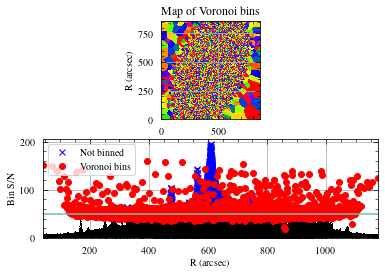

In [3]:
from vorbin.voronoi_2d_binning import voronoi_2d_binning
import dill
import time  # to see how long Voronoi binning takes
%matplotlib inline
# 
# Specify reference arrays for Voronoi binning.
# The resulting binning pattern will be applied across all bands
# 
ref_data = uband_data
ref_noise = uband_noise
ref_wcs = uband_wcs
print("Reference data array shape:", np.shape(ref_data))
# 
# Voronoi binning preparation
# 
snr_target = 50
#
y_coords, x_coords = np.meshgrid(
    np.arange(ref_data.shape[0]), np.arange(ref_data.shape[1])
)
x_coords, y_coords = x_coords.T, y_coords.T
isgood_vorbin = np.isfinite(ref_data) & np.isfinite(ref_noise)
# 
# Voronoi binning of reference data and noise
# 
starttime = time.time()
binNum, xNode, yNode, xBar, yBar, sn, nPixels, scale = voronoi_2d_binning(
    x_coords[isgood_vorbin],
    y_coords[isgood_vorbin],
    ref_data[isgood_vorbin],
    ref_noise[isgood_vorbin],
    targetSN=snr_target,
    pixelsize=1,
    cvt=False,
    quiet=True,
    wvt=False,
    sn_func=None,
)
endtime = time.time()
timediff = endtime - starttime  # seconds
print("It took", timediff / 60, "minutes to complete Voronoi binning.")
# 
# Save inputs and raw outputs of Voronoi binning
# 
vorbin_outfile = galpath + f"{galaxy}_vorbin_SNR{snr_target}_In+Out.pkl"
with open(vorbin_outfile, "wb") as f:
    dill.dump(
        {
            # "full_shape": np.shape(data_u_cut),  # same as isgood_vorbin.shape
            "x_coords": x_coords,
            "y_coords": y_coords,
            "signal": ref_data,
            "noise": ref_noise,
            "isgood_vorbin": isgood_vorbin,
            "snr_target": snr_target,
            "binNum": binNum,
            "xNode": xNode,
            "yNode": yNode,
            "xBar": xBar,
            "yBar": yBar,
            "sn": sn,
            "nPixels": nPixels,
            "scale": scale,
            "wcs": ref_wcs,
            "wcs_array_shape": ref_wcs.array_shape,
        },
        f,
    )
print(f"Pickled {vorbin_outfile}")

Process outputs so they are more usable. Save results


In [7]:
#
# Assign each pixel to its Voronoi bin. Note that we cannot simply reshape the array since
# there are holes in our input data!
#
binNum_arr = np.zeros(ref_data.shape) * np.nan
for i, (x, y) in enumerate(zip(x_coords[isgood_vorbin], y_coords[isgood_vorbin])):
    binNum_arr[y, x] = binNum[i]  # binNum has same length as coords
#
# Bin the data and noise according to the Voronoi bins
#
uband_data_vorbinned = np.zeros(uband_data.shape) * np.nan
gband_data_vorbinned = np.zeros(gband_data.shape) * np.nan
iband_data_vorbinned = np.zeros(iband_data.shape) * np.nan
zband_data_vorbinned = np.zeros(zband_data.shape) * np.nan
uband_noise_vorbinned = np.zeros(uband_noise.shape) * np.nan
gband_noise_vorbinned = np.zeros(gband_noise.shape) * np.nan
iband_noise_vorbinned = np.zeros(iband_noise.shape) * np.nan
zband_noise_vorbinned = np.zeros(zband_noise.shape) * np.nan
px_per_bin = np.zeros(uband_data.shape) * np.nan  # all data/noise should have same shape
for i in np.unique(binNum):
    bin_idx = binNum_arr == i  # all of these pixels are in the same bin
    uband_data_vorbinned[bin_idx], uband_noise_vorbinned[bin_idx] = fu.calc_tot_sn(
        uband_data[bin_idx], uband_noise[bin_idx], func=np.nansum
    )
    gband_data_vorbinned[bin_idx], gband_noise_vorbinned[bin_idx] = fu.calc_tot_sn(
        gband_data[bin_idx], gband_noise[bin_idx], func=np.nansum
    )
    iband_data_vorbinned[bin_idx], iband_noise_vorbinned[bin_idx] = fu.calc_tot_sn(
        iband_data[bin_idx], iband_noise[bin_idx], func=np.nansum
    )
    zband_data_vorbinned[bin_idx], zband_noise_vorbinned[bin_idx] = fu.calc_tot_sn(
        zband_data[bin_idx], zband_noise[bin_idx], func=np.nansum
    )
    px_per_bin[bin_idx] = nPixels[i]
# 
# Pickle the results
# 
vorbinned_results_outfile = galpath + f"{galaxy}_vorbin_SNR{snr_target}_ugizBinned.pkl"
with open(vorbinned_results_outfile, "wb") as f:
    dill.dump(
        {
            "x_coords": x_coords,
            "y_coords": y_coords,
            "wcs": ref_wcs,
            "wcs_array_shape": ref_wcs.array_shape,
            "uband_signal": uband_data_vorbinned,
            "uband_noise": uband_noise_vorbinned,
            "gband_signal": gband_data_vorbinned,
            "gband_noise": gband_noise_vorbinned,
            "iband_signal": iband_data_vorbinned,
            "iband_noise": iband_noise_vorbinned,
            "zband_signal": zband_data_vorbinned,
            "zband_noise": zband_noise_vorbinned,
            "snr_target": snr_target,  # float or int
            "px_per_bin": px_per_bin,  # 2D array with same shape as coords/signal/noise
            "binNum": binNum,  # 1D array returned by vorbin. Only contains "good" pixels
            "binNum_arr": binNum_arr,  # 2D array with same shape as coords/signal/noise
        },
        f,
    )
print(f"Pickled {vorbinned_results_outfile}")


Pickled /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_vorbin_SNR50_ugizBinned.pkl


# Stellar Mass Maps


In [1]:
# Need to switch directories if using VS Code + sshfs
galaxy = "NGC4380"
galpath = f"/arc/home/IsaacCheng/coop_f2021/galaxies/{galaxy}/"
%cd "$galpath"
# 
import astropy.units as u
import dill
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.io import fits
from astropy.wcs import WCS
# 
# Load my own packages
# 
import sys
sys.path.append("/arc/home/IsaacCheng/coop_f2021/packages")
import fits_utils as fu
import plot_utils as pu
# Reload my packages
import importlib
importlib.reload(fu)
importlib.reload(pu)
# 
galdist = 16.5 * u.Mpc  # distance to centre of Virgo cluster. Assume 10% uncertainty

/arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380


## Nyquist (4 arcsec pixels) resolution

We use the Prospector SED fitting library to estimate various spatially resolved
properties of the galaxy.

Following are the assumptions used in each iteration:
- `iter01`: no dust at all
- `iter02`: accounts for dust reddening in the Milky Way, no dust in the target galaxy
  (i.e., fixed optical depth of dust in target galaxy at zero)
- `iter03`: accounts for dust in the Milky Way and in the galaxy (i.e., allows optical
  depth of dust to vary in the target galaxy) 


In [20]:
sed_ver = "iter03"
#
# Load SED fitting results
# 
sed_results = fu.load_sed_results(
    f"/arc/home/IsaacCheng/coop_f2021/sed_fits/NGC4380_Nyquist/{sed_ver}/",
    1763,
    skip=[783]
)
# 
# VERTICO CO Data
# 
# Nyquist resolution. Units of K.km/s
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/nyquistPix/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_np_round_mom0_Kkms-1.fits"
# Ico_unc_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/nyquistPix/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_np_round_mom0_unc.fits"  # uncertainty
Ico_data, co_header = fits.getdata(Ico_path, header=True)
# Ico_unc = fits.getdata(Ico_unc_path)  # uncertainty
co_wcs = WCS(co_header)
nyquist_shape = Ico_data.shape


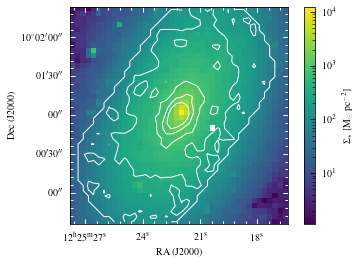

In [31]:
#
# Unpack SED-fitting results
# 
sed_coords = sed_results[:, 0].reshape(*nyquist_shape).astype(int)  # no transpose needed
sed_mass_50p = sed_results[:, 4].reshape(*nyquist_shape)  # median
# sed_mass_16p = sed_results[:, 5].reshape(*nyquist_shape)  # 16th percentile
# sed_mass_84p = sed_results[:, 6].reshape(*nyquist_shape)  # 84th percentile
# 
# Convert stellar mass to stellar mass density
# 
px_dimensions, _ = fu.calc_pc_per_px(co_wcs, galdist, dist_err=None)  # parsecs
px_area = px_dimensions[0] * px_dimensions[1]  # square parsecs
sed_M_density_50p = sed_mass_50p / px_area  # solar masses per square parsec
# sed_M_density_16p = sed_mass_16p / px_area  # solar masses per square parsec
# sed_M_density_84p = sed_mass_84p / px_area  # solar masses per square parsec
# 
# Plot
# 
fig, ax = plt.subplots(subplot_kw={"projection": co_wcs})
img = ax.imshow(sed_M_density_50p, norm=mpl.colors.LogNorm())  # one pixel is missing
cbar = fig.colorbar(img)
cbar.set_label(r"$\Sigma_\star$ [$\rm M_\odot\; pc^{-2}$]")
ax.contour(
    Ico_data,
    transform=ax.get_transform(co_wcs),
    levels=range(5),
    colors="w",
    linewidths=1,
)
ax.tick_params(color="w")
ax.set_xlabel("RA (J2000)")
ax.set_ylabel("Dec (J2000)")
ax.grid(False)
# fig.savefig(galpath + f"{galaxy}_regBin_SED_Nyquist_{sed_ver}.pdf")
plt.show()
#
# Plot CO data (for reference
#
# fig, ax = plt.subplots(subplot_kw={"projection": co_wcs})
# img = ax.imshow(Ico_data)
# cbar = fig.colorbar(img)
# ax.set_xlabel("RA (J2000)")
# ax.set_ylabel("Dec (J2000)")
# ax.grid(False)
# plt.show()

## 2 arcsec pixels + 9 arcsec beam resolution


### Mass-to-Light vs. Colour Relation (Taylor et al., 2011)

Estimate the mass-to-light ratio (and luminosity + stellar mass density) of the galaxy
using g-i colours and i-band fluxes.

Following Eq. (7) of Taylor et al. (2011), the mass-to-light ($M_\star/L_i$) ratio can be
estimated using:

$$ \log(M_\star/L_i) = 0.70 \times (g-i) - 0.68 $$

where $(g-i)$ are the g-i colours.

The i-band luminosity of the data in solar units ($L_i$) can be calculated using:

$$\log(L_i\, [L_{i,\odot}]) = -0.4 \times (\mathrm{M}_i - \mathrm{M}_{i, \odot})$$

where $\mathrm{M}_i$ are the absolute i-band AB magnitudes of the data and
$\mathrm{M}_{i,\odot}=4.58$ is the absolute i-band AB magnitude of the Sun. Notice that a
more negative $\mathrm{M}_i$ directly leads to a higher $L_i$ estimate.

Combining the two equations above, we arrive at the following equation that gives an
estimate of the stellar mass ($M_\star$) in units of solar masses (N.B. $M$ vs.
$\mathrm{M}$):

$$\log(M_\star\; [M_\odot]) = 0.70 \times (g-i) - 0.68 + \log(L_i) = 0.70 \times (g-i) - 0.4 \times \mathrm{M}_i + 1.152 $$

This is Eq. (8) of Taylor et al. (2011).

Finally, note that this formula (i.e., Eq. (7) and therefore also Eq. (8)) was empirically
derived and assumes a simple exponentially-decreasing stellar disk.


In [10]:
# 
# Load 9 arcsec beam. 2 arcsec px resolution optical data
# 
gband_infile = galpath + f"{galaxy}_regBin_gband_9as.pkl"
with open(gband_infile, "rb") as f:
    file = dill.load(f)
    gband_signal = file["signal_binned"]
    gband_noise = file["noise_binned"]
    nine_arcsec_wcs = file["wcs_binned"]
    nine_arcsec_wcs.array_shape = file["wcs_binned_array_shape"]
iband_infile = galpath + f"{galaxy}_regBin_iband_9as.pkl"
with open(iband_infile, "rb") as f:
    file = dill.load(f)
    iband_signal = file["signal_binned"]
    iband_noise = file["noise_binned"]
nine_arcsec_shape = gband_signal.shape
# 
# Taylor+2011 stellar mass estimates
# 
results, errors = fu.MLi_taylor2011(
    gband_signal,
    iband_signal,
    galdist,
    nine_arcsec_wcs,
    gband_err=gband_noise,
    iband_err=iband_noise,
    px_per_bin=1,
)
avg_iband_abs_mag, gi_colour, Li, MLi_ratio, M, M_density = results
avg_iband_abs_mag_err, gi_colour_err, Li_err, MLi_ratio_err, M_err, M_density_err = errors
# 
# Load CO data
# 
# 9 arcsec beam, 2 arcsec pixels. Units of K.km/s
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_Kkms-1.fits"
# Ico_unc_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_unc.fits"  # uncertainty
Ico_data, co_header = fits.getdata(Ico_path, header=True)
# Ico_unc = fits.getdata(Ico_unc_path)  # uncertainty
co_wcs = WCS(co_header)


~~Notice the lack of "holes" in the following stellar mass density plot. This is because
each pixel in the image below is comprised of so many native-resolution NGVS pixels,
thereby smearing out and eliminating any of the "holes" we see in the high-resolution,
Voronoi-binned stellar mass density image.~~

The "holes" may be an artifact of my colour bar scale over-emphasizing the dips in stellar
mass density. Nonetheless, it revealed a big limitation of these MLCRs in general (also
see Zibetti et al. 2009 for further discussion).


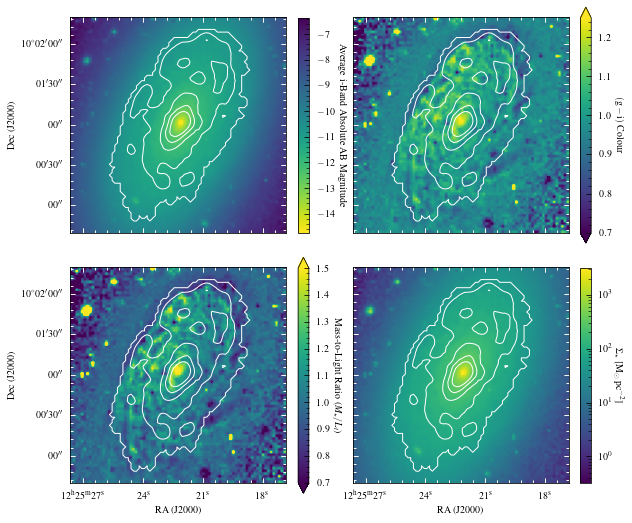

In [13]:
# 
# Plot
# 
%matplotlib inline
plt.close("all")
# 
cmap = "viridis"
fig, axs = plt.subplots(2, 2, figsize=(8, 7.25), subplot_kw={"projection": nine_arcsec_wcs})
ax1, ax2, ax3, ax4 = axs[0, 0], axs[0, 1], axs[1, 0], axs[1, 1]
# 
# Average i-band absolute AB magnitudes
# 
img1 = ax1.imshow(avg_iband_abs_mag, cmap=cmap + "_r")
cbar1 = fig.colorbar(img1, ax=ax1, fraction=0.045)
cbar1.set_label("Average i-Band Absolute AB Magnitude", rotation=270, labelpad=12)
cbar1.ax.yaxis.set_offset_position("left")
ax1.contour(
    Ico_data,
    transform=ax1.get_transform(co_wcs),
    levels=range(5),
    colors="w",
    linewidths=1,
    zorder=10,
)
ax1.set_ylabel("Dec (J2000)")
ax1.coords[0].set_ticklabel_visible(False)
ax1.grid(False)
ax1.set_aspect("equal")
# 
# g-i colours
# 
img2 = ax2.imshow(gi_colour, cmap=cmap, vmin=0.7, vmax=1.25)
cbar2 = fig.colorbar(img2, ax=ax2, fraction=0.045, extend="both")
cbar2.set_label(r"$\rm (g-i)$ Colour", rotation=270, labelpad=12)
cbar2.ax.yaxis.set_offset_position("left")
ax2.contour(
    Ico_data,
    transform=ax2.get_transform(co_wcs),
    levels=range(5),
    colors="w",
    linewidths=1,
)
ax2.coords[0].set_ticklabel_visible(False)
ax2.coords[1].set_ticklabel_visible(False)
ax2.grid(False)
ax2.set_aspect("equal")
# 
# Mass-to-light ratios
# 
img3 = ax3.imshow(MLi_ratio, cmap=cmap, vmin=0.7, vmax=1.5)
cbar3 = fig.colorbar(img3, ax=ax3, fraction=0.045, extend="both")
cbar3.set_label(r"Mass-to-Light Ratio ($M_\star / L_i$)", rotation=270, labelpad=12)
cbar3.ax.yaxis.set_offset_position("left")
ax3.contour(
    Ico_data,
    transform=ax3.get_transform(co_wcs),
    levels=range(5),
    colors="w",
    linewidths=1,
)
ax3.set_xlabel("RA (J2000)")
ax3.set_ylabel("Dec (J2000)")
ax3.grid(False)
ax3.set_aspect("equal")
#
# Stellar mass densities
#
# img4 = ax4.imshow(M_density, cmap=cmap, norm=mpl.colors.LogNorm(vmin=50, vmax=2000))
# cbar4 = fig.colorbar(img4, ax=ax4, fraction=0.045, extend="both")
img4 = ax4.imshow(M_density, cmap=cmap, norm=mpl.colors.LogNorm())
cbar4 = fig.colorbar(img4, ax=ax4, fraction=0.045)
cbar4.set_label(r"$\Sigma_\star$ [$\rm M_\odot\; pc^{-2}$]", rotation=270, labelpad=12)
cbar4.ax.yaxis.set_offset_position("left")
ax4.contour(
    Ico_data,
    transform=ax4.get_transform(co_wcs),
    levels=range(5),
    colors="w",
    linewidths=1,
)
ax4.set_xlabel("RA (J2000)")
ax4.coords[1].set_ticklabel_visible(False)
ax4.grid(False)
ax4.set_aspect("equal")
# 
for ax in fig.get_axes():
    if ax.__class__.__name__ == "AxesSubplot":
        continue  # don't modify colorbar axes
    ax.label_outer()  # share axes per row/column
    ax.tick_params(color="w")  # white ticks
fig.tight_layout()
plt.subplots_adjust(hspace=0)
# fig.savefig(galpath + f"{galaxy}_regBin_9as_MLi_v2.pdf")
plt.show()

## High resolution (Voronoi binning)


### Mass-to-Light vs. Colour Relation (Taylor et al., 2011)

Estimate the mass-to-light ratio (and luminosity + stellar mass density) of the galaxy
using g-i colours and i-band fluxes.

Following Eq. (7) of Taylor et al. (2011), the mass-to-light ($M_\star/L_i$) ratio can be
estimated using:

$$ \log(M_\star/L_i) = 0.70 \times (g-i) - 0.68 $$

where $(g-i)$ are the g-i colours.

The i-band luminosity of the data in solar units ($L_i$) can be calculated using:

$$\log(L_i\, [L_{i,\odot}]) = -0.4 \times (\mathrm{M}_i - \mathrm{M}_{i, \odot})$$

where $\mathrm{M}_i$ are the absolute i-band AB magnitudes of the data and
$\mathrm{M}_{i,\odot}=4.58$ is the absolute i-band AB magnitude of the Sun. Notice that a
more negative $\mathrm{M}_i$ directly leads to a higher $L_i$ estimate.

Combining the two equations above, we arrive at the following equation that gives an
estimate of the stellar mass ($M_\star$) in units of solar masses (N.B. $M$ vs.
$\mathrm{M}$):

$$\log(M_\star\; [M_\odot]) = 0.70 \times (g-i) - 0.68 + \log(L_i) = 0.70 \times (g-i) - 0.4 \times \mathrm{M}_i + 1.152 $$

This is Eq. (8) of Taylor et al. (2011).

Finally, note that this formula (i.e., Eq. (7) and therefore also Eq. (8)) was empirically
derived and assumes a simple exponentially-decreasing stellar disk.


In [7]:
snr_target = 50  # specifies which voronoi binning file to use
#
# Load data
#
vorbin_results = galpath + f"{galaxy}_vorbin_SNR{snr_target}_ugizBinned.pkl"
with open(vorbin_results, "rb") as f:
    file = dill.load(f)
    gband_signal = file["gband_signal"]
    gband_noise = file["gband_noise"]
    iband_signal = file["iband_signal"]
    iband_noise = file["iband_noise"]
    vorbin_wcs = file["wcs"]
    vorbin_wcs.array_shape = file["wcs_array_shape"]
    px_per_bin = file["px_per_bin"]
#
# Calculate quantities
#
results, errors = fu.MLi_taylor2011(
    gband_signal,
    iband_signal,
    galdist,
    vorbin_wcs,
    gband_err=gband_noise,
    iband_err=iband_noise,
    px_per_bin=px_per_bin,
)
avg_iband_abs_mag, gi_colour, Li, MLi_ratio, M, M_density = results
avg_iband_abs_mag_err, gi_colour_err, Li_err, MLi_ratio_err, M_err, M_density_err = errors
# 
# Load VERTICO data (for contours)
# 
# 9 arcsec beam, 2 arcsec pixels. Units of K.km/s
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_Kkms-1.fits"
Ico_data, co_header = fits.getdata(Ico_path, header=True)
co_wcs = WCS(co_header)


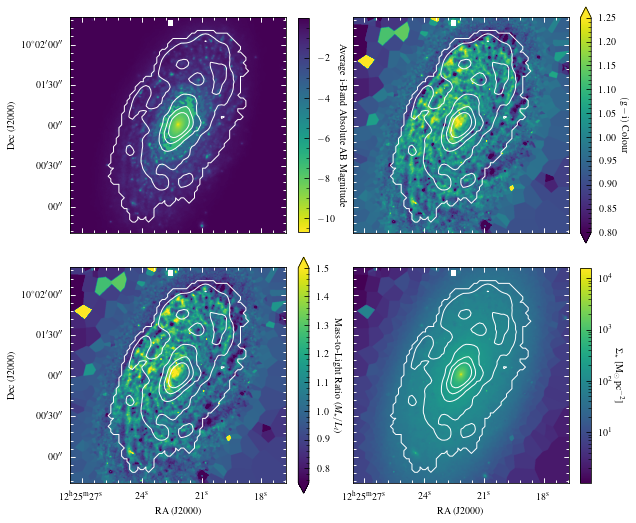

In [9]:
# 
# Plot
# 
%matplotlib inline
plt.close("all")
# 
cmap = "viridis"
fig, axs = plt.subplots(2, 2, figsize=(8, 7.25), subplot_kw={"projection": vorbin_wcs})
ax1, ax2, ax3, ax4 = axs[0, 0], axs[0, 1], axs[1, 0], axs[1, 1]
# 
# Average i-band absolute AB magnitudes
# 
img1 = ax1.imshow(avg_iband_abs_mag, cmap=cmap + "_r")
cbar1 = fig.colorbar(img1, ax=ax1, fraction=0.045)
cbar1.set_label("Average i-Band Absolute AB Magnitude", rotation=270, labelpad=12)
cbar1.ax.yaxis.set_offset_position("left")
ax1.contour(
    Ico_data,
    transform=ax1.get_transform(co_wcs),
    levels=range(5),
    colors="w",
    linewidths=1,
    zorder=10,
)
ax1.set_ylabel("Dec (J2000)")
ax1.coords[0].set_ticklabel_visible(False)
ax1.grid(False)
ax1.set_aspect("equal")
# 
# g-i colours
# 
img2 = ax2.imshow(gi_colour, cmap=cmap, vmin=0.8, vmax=1.25)
cbar2 = fig.colorbar(img2, ax=ax2, fraction=0.045, extend="both")
cbar2.set_label(r"$\rm (g-i)$ Colour", rotation=270, labelpad=12)
cbar2.ax.yaxis.set_offset_position("left")
ax2.contour(
    Ico_data,
    transform=ax2.get_transform(co_wcs),
    levels=range(5),
    colors="w",
    linewidths=1,
)
ax2.coords[0].set_ticklabel_visible(False)
ax2.coords[1].set_ticklabel_visible(False)
ax2.grid(False)
ax2.set_aspect("equal")
# 
# Mass-to-light ratios
# 
img3 = ax3.imshow(MLi_ratio, cmap=cmap, vmin=0.75, vmax=1.5)
cbar3 = fig.colorbar(img3, ax=ax3, fraction=0.045, extend="both")
cbar3.set_label(r"Mass-to-Light Ratio ($M_\star / L_i$)", rotation=270, labelpad=12)
cbar3.ax.yaxis.set_offset_position("left")
ax3.contour(
    Ico_data,
    transform=ax3.get_transform(co_wcs),
    levels=range(5),
    colors="w",
    linewidths=1,
)
ax3.set_xlabel("RA (J2000)")
ax3.set_ylabel("Dec (J2000)")
ax3.grid(False)
ax3.set_aspect("equal")
#
# Stellar mass densities
#
# img4 = ax4.imshow(M_density, cmap=cmap, norm=mpl.colors.LogNorm(vmin=50, vmax=2000))
# cbar4 = fig.colorbar(img4, ax=ax4, fraction=0.045, extend="both")
img4 = ax4.imshow(M_density, cmap=cmap, norm=mpl.colors.LogNorm())
cbar4 = fig.colorbar(img4, ax=ax4, fraction=0.045)
cbar4.set_label(r"$\Sigma_\star$ [$\rm M_\odot\; pc^{-2}$]", rotation=270, labelpad=12)
cbar4.ax.yaxis.set_offset_position("left")
ax4.contour(
    Ico_data,
    transform=ax4.get_transform(co_wcs),
    levels=range(5),
    colors="w",
    linewidths=1,
)
ax4.set_xlabel("RA (J2000)")
ax4.coords[1].set_ticklabel_visible(False)
ax4.grid(False)
ax4.set_aspect("equal")
# 
for ax in fig.get_axes():
    if ax.__class__.__name__ == "AxesSubplot":
        continue  # don't modify colorbar axes
    ax.label_outer()  # share axes per row/column
    ax.tick_params(color="w")  # white ticks
fig.tight_layout()
plt.subplots_adjust(hspace=0)
# fig.savefig(galpath + f"{galaxy}_vorbin_SNR{snr_target}_MLi_v2.pdf")
plt.show()

# Compare various SED fitting results

Need:
1. M_* from Taylor+11 vs. M_* from Prospector (iter03).
2. M_* from Roediger+Courteau15 vs. M_* from Prospector (iter03).
3. MAP M_* from iter02 of Prospector vs. iter03.
4. P50 age from iter02 of Prospector vs. iter03.


In [11]:
# Need to switch directories if using VS Code + sshfs
galaxy = "NGC4380"
galpath = f"/arc/home/IsaacCheng/coop_f2021/galaxies/{galaxy}/"
%cd "$galpath"
# 
import astropy.units as u
import dill
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from astropy.io import fits
from astropy.wcs import WCS
from ltsfit.lts_linefit import lts_linefit
# 
# Load my own packages
# 
import sys
sys.path.append("/arc/home/IsaacCheng/coop_f2021/packages")
import fits_utils as fu
import plot_utils as pu
# Reload my packages
import importlib
importlib.reload(fu)
importlib.reload(pu)
# 
galdist = 16.5 * u.Mpc  # distance to centre of Virgo cluster. Assume 10% uncertainty

/arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380


## $M_\star$ from Taylor et al. (2011) vs. $M_\star$ from Prospector's `iter03`

We use the 16th and 84th percentile to get the (asymmetric) error bars for the SED
results. For LTS fitting, we assume symmetric errors.

The mass-to-light vs. colour relation (MLCR) from Taylor et al. (2011) consistently
predicts stellar mass densities less than those from `Prospector` SED-fitting. 


In [12]:
sed_ver = "iter03"
# 
# Load Nyquist-resolution optical data
# 
gband_infile = galpath + f"{galaxy}_regBin_gband_nyquist.pkl"
with open(gband_infile, "rb") as f:
    file = dill.load(f)
    gband_signal = file["signal_binned"]
    gband_noise = file["noise_binned"]
    nyquist_wcs = file["wcs_binned"]
    nyquist_wcs.array_shape = file["wcs_binned_array_shape"]
iband_infile = galpath + f"{galaxy}_regBin_iband_nyquist.pkl"
with open(iband_infile, "rb") as f:
    file = dill.load(f)
    iband_signal = file["signal_binned"]
    iband_noise = file["noise_binned"]
nyquist_shape = gband_signal.shape
# 
# Taylor+2011 stellar mass estimates
# 
results, errors = fu.MLi_taylor2011(
    gband_signal,
    iband_signal,
    galdist,
    nyquist_wcs,
    gband_err=gband_noise,
    iband_err=iband_noise,
    px_per_bin=1,
)
avg_iband_abs_mag, gi_colour, Li, MLi_ratio, M, M_density = results
avg_iband_abs_mag_err, gi_colour_err, Li_err, MLi_ratio_err, M_err, M_density_err = errors
#
# Load SED fitting results
# 
sed_results = fu.load_sed_results(
    f"/arc/home/IsaacCheng/coop_f2021/sed_fits/NGC4380_Nyquist/{sed_ver}/",  # Nyquist
    1763,
    skip=[783]
)
#
# Unpack SED-fitting results
# 
sed_coords = sed_results[:, 0].reshape(*nyquist_shape).astype(int)  # no transpose needed
sed_mass_50p = sed_results[:, 4].reshape(*nyquist_shape)  # median
sed_mass_16p = sed_results[:, 5].reshape(*nyquist_shape)  # 16th percentile
sed_mass_84p = sed_results[:, 6].reshape(*nyquist_shape)  # 84th percentile
# 
# Convert stellar mass to stellar mass density
# 
px_dimensions, _ = fu.calc_pc_per_px(nyquist_wcs, galdist, dist_err=None)  # parsecs
px_area = px_dimensions[0] * px_dimensions[1]  # square parsecs
sed_M_density_50p = sed_mass_50p / px_area  # solar masses per square parsec
sed_M_density_16p = sed_mass_16p / px_area  # solar masses per square parsec
sed_M_density_84p = sed_mass_84p / px_area  # solar masses per square parsec

In [13]:
#
# Take log10 of data (for plots & LTS fitting)
#
sed_M_density_err_equal = 0.5 * (sed_M_density_84p - sed_M_density_16p)  # symmetric error
# 
log_sed_M_density_50p = np.log10(sed_M_density_50p)
log_sed_M_density_err_equal = sed_M_density_err_equal / (np.log(10) * sed_M_density_50p)
log_M_density = np.log10(M_density)
log_M_density_err = M_density_err / (np.log(10) * M_density)
# Generate mask since iter03 is missing 1 pixel & LTS cannot handle this
isgood_M_density = (
    np.isfinite(log_sed_M_density_50p)
    & np.isfinite(log_sed_M_density_err_equal)
    & np.isfinite(log_M_density)
    & np.isfinite(log_M_density_err)
)


In [14]:
# 
# LTS-fitting
# 
pivot = np.median(log_sed_M_density_50p[isgood_M_density])
clip = 2.6
popt = lts_linefit(
    log_sed_M_density_50p[isgood_M_density],
    log_M_density[isgood_M_density],
    log_sed_M_density_err_equal[isgood_M_density],
    log_M_density_err[isgood_M_density],
    clip=clip,
    epsy=True,
    corr=True,
    frac=None,
    pivot=pivot,
    plot=True,
    text=True,
)
yint, slope = popt.ab
yint_err, slope_err = popt.ab_err
rms = popt.rms
corr_yint = yint - slope * pivot
corr_yint_err = np.sqrt(yint_err ** 2 + (slope_err * pivot) ** 2)
print("Actual y-intercept:", corr_yint, r"\pm", corr_yint_err)

sig_int:     0.0000     -0.9356
No intrinsic scatter or errors overestimated
Repeat at best fitting solution
sig_int:     0.0000     -0.9356
################# Values and formal errors ################
 intercept:  1.4089 +/- 0.0051
     slope:  0.9762 +/- 0.0090
   scatter:  0. +/- 0.0
Observed rms scatter: 0.052
y = a + b*(x - pivot) with pivot = 2.095
Spearman r=0.99 and p=0
Pearson r=0.98 and p=0
##########################################################
seconds 2.35
Actual y-intercept: -0.6364218232289247 \pm 0.01946949724750499


Scatter plot. Notice the very small errors in the MLCR-derived stellar mass densities
compared to the much larger errors in the SED-fitted results.

Slope is slightly below 1, which means SED-derived stellar masses grow faster than
MLCR-derived stellar mass densities. Also, MLCR results are consistently less than the SED
predictions.

Slope = $0.9762 \pm 0.0090$, y-int = $-0.636 \pm 0.019$

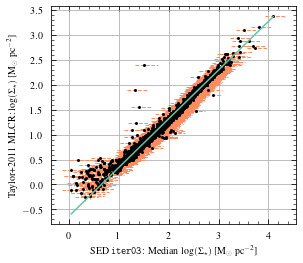

In [16]:
%matplotlib inline
#
# Create array containing the lower and upper errors
#
sed_M_density_low_err = sed_M_density_50p - sed_M_density_16p
sed_M_density_high_err = sed_M_density_84p - sed_M_density_50p
log_sed_M_density_low_err = sed_M_density_low_err / (np.log(10) * sed_M_density_50p)
log_sed_M_density_high_err = sed_M_density_high_err / (np.log(10) * sed_M_density_50p)
log_sed_M_density_err_unequal = np.vstack(
    (log_sed_M_density_low_err.flatten(), log_sed_M_density_high_err.flatten())
)
#
# Scatter plot with asymmetric SED errors
#
fig, ax = plt.subplots()
ebar = ax.errorbar(
    x=log_sed_M_density_50p.flatten(),
    y=log_M_density.flatten(),
    xerr=log_sed_M_density_err_unequal,
    yerr=log_M_density_err.flatten(),
    fmt=".",
    markersize=4,
    color="k",
    ecolor="C1",
    elinewidth=1,
    capsize=0,
)
ebar[-1][0].set_linestyle("--")  # dashed error bars
ebar[-1][1].set_linestyle("--")  # dashed error bars
pu.add_lts_line(
    ax,
    slope,
    yint,
    pivot,
    lts_rms=None,
    lts_clip=None,
    xdata=log_sed_M_density_50p,
    lts_color="C0",
    zorder=10,
)
ax.set_xlabel(r"SED \texttt{iter03}: Median $\rm \log(\Sigma_\star)$ [$\rm M_\odot\; pc^{-2}$]")
ax.set_ylabel(r"Taylor+2011 MLCR: $\rm \log(\Sigma_\star)$ [$\rm M_\odot\; pc^{-2}$]")
# ax.loglog()
ax.set_aspect("equal")
# fig.savefig(galpath + f"{galaxy}_TaylorMLi_vs_SED_iter03_scatter.pdf")
plt.show()


Saved plot to /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_TaylorMLi_vs_SED_iter03_kde.pdf!


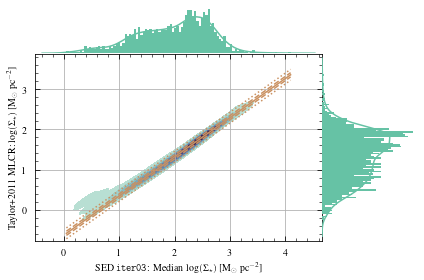

In [18]:
# 
# Joint contour plot
# 
pu.joint_contour_plot(
    log_sed_M_density_50p.flatten(),
    log_M_density.flatten(),
    plot_lts=True,
    lts_slope=slope,
    lts_int=yint,
    lts_pivot=pivot,
    lts_rms=rms,
    lts_clip=clip,
    fig_xlabel=r"SED \texttt{iter03}: Median $\rm \log(\Sigma_\star)$ [$\rm M_\odot\; pc^{-2}$]",
    fig_ylabel=r"Taylor+2011 MLCR: $\rm \log(\Sigma_\star)$ [$\rm M_\odot\; pc^{-2}$]",
    plot_scatter=False,
    # fig_savename=galpath + f"{galaxy}_TaylorMLi_vs_SED_iter03_kde.pdf",
)

## $M_\star$ from Roediger & Courteau (2015) vs. $M_\star$ from Prospector's `iter03`

The FSPS mmass-to-light vs. colour relation (MLCR) from Roediger & Courteau (2015) is:

$$ \log(M_\star/L_i) = 0.831 \times ({\rm g-i}) - 0.597$$

We use the 16th and 84th percentile to get the (asymmetric) error bars for the SED
results. For LTS fitting, we assume symmetric errors.

The mass-to-light vs. colour relation (MLCR) from Roediger & Courteau (2015) consistently
predicts stellar mass densities less than those from `Prospector` SED-fitting. 


In [19]:
sed_ver = "iter03"
# 
# Load Nyquist-resolution optical data
# 
gband_infile = galpath + f"{galaxy}_regBin_gband_nyquist.pkl"
with open(gband_infile, "rb") as f:
    file = dill.load(f)
    gband_signal = file["signal_binned"]
    gband_noise = file["noise_binned"]
    nyquist_wcs = file["wcs_binned"]
    nyquist_wcs.array_shape = file["wcs_binned_array_shape"]
iband_infile = galpath + f"{galaxy}_regBin_iband_nyquist.pkl"
with open(iband_infile, "rb") as f:
    file = dill.load(f)
    iband_signal = file["signal_binned"]
    iband_noise = file["noise_binned"]
nyquist_shape = gband_signal.shape
# 
# Roediger & Courteau (2015) stellar mass estimates
# 
gi_colour = fu.calc_colour(gband_signal, iband_signal)
gi_colour_err = fu.calc_colour_err(gband_signal, iband_signal, gband_noise, iband_noise)
results, errors = fu.ML_from_mlcr(
    gi_colour,
    iband_signal,
    galdist,
    nyquist_wcs,
    colour_err=gi_colour_err,
    flux_err=iband_noise,
    px_per_bin=1,
    slope=0.831,
    yint=-0.597,
    sun_abs_mag_in_flux_band=4.58,
    zpt=30.0,
)
avg_iband_abs_mag, Li, MLi_ratio, M, M_density = results
avg_iband_abs_mag_err, Li_err, MLi_ratio_err, M_err, M_density_err = errors
#
# Load SED fitting results
# 
sed_results = fu.load_sed_results(
    f"/arc/home/IsaacCheng/coop_f2021/sed_fits/NGC4380_Nyquist/{sed_ver}/",  # Nyquist
    1763,
    skip=[783]
)
#
# Unpack SED-fitting results
# 
sed_coords = sed_results[:, 0].reshape(*nyquist_shape).astype(int)  # no transpose needed
sed_mass_50p = sed_results[:, 4].reshape(*nyquist_shape)  # median
sed_mass_16p = sed_results[:, 5].reshape(*nyquist_shape)  # 16th percentile
sed_mass_84p = sed_results[:, 6].reshape(*nyquist_shape)  # 84th percentile
# 
# Convert stellar mass to stellar mass density
# 
px_dimensions, _ = fu.calc_pc_per_px(nyquist_wcs, galdist, dist_err=None)  # parsecs
px_area = px_dimensions[0] * px_dimensions[1]  # square parsecs
sed_M_density_50p = sed_mass_50p / px_area  # solar masses per square parsec
sed_M_density_16p = sed_mass_16p / px_area  # solar masses per square parsec
sed_M_density_84p = sed_mass_84p / px_area  # solar masses per square parsec

In [20]:
#
# Take log10 of data (for plots & LTS fitting)
#
sed_M_density_err_equal = 0.5 * (sed_M_density_84p - sed_M_density_16p)  # symmetric error
# 
log_sed_M_density_50p = np.log10(sed_M_density_50p)
log_sed_M_density_err_equal = sed_M_density_err_equal / (np.log(10) * sed_M_density_50p)
log_M_density = np.log10(M_density)
log_M_density_err = M_density_err / (np.log(10) * M_density)
# Generate mask since iter03 is missing 1 pixel & LTS cannot handle this
isgood_M_density = (
    np.isfinite(log_sed_M_density_50p)
    & np.isfinite(log_sed_M_density_err_equal)
    & np.isfinite(log_M_density)
    & np.isfinite(log_M_density_err)
)


sig_int:     0.0000     -0.9342
No intrinsic scatter or errors overestimated
Repeat at best fitting solution
sig_int:     0.0000     -0.9342
################# Values and formal errors ################
 intercept:  1.6169 +/- 0.0052
     slope:  0.9855 +/- 0.0090
   scatter:  0. +/- 0.0
Observed rms scatter: 0.053
y = a + b*(x - pivot) with pivot = 2.095
Spearman r=0.99 and p=0
Pearson r=0.98 and p=0
##########################################################
seconds 2.48
Actual y-intercept: -0.44807189762486055 \pm 0.019638111177941203


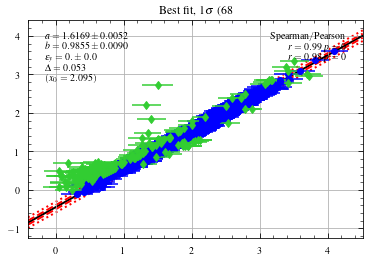

In [21]:
# 
# LTS-fitting
# 
pivot = np.median(log_sed_M_density_50p[isgood_M_density])
clip = 2.6
popt = lts_linefit(
    log_sed_M_density_50p[isgood_M_density],
    log_M_density[isgood_M_density],
    log_sed_M_density_err_equal[isgood_M_density],
    log_M_density_err[isgood_M_density],
    clip=clip,
    epsy=True,
    corr=True,
    frac=None,
    pivot=pivot,
    plot=True,
    text=True,
)
yint, slope = popt.ab
yint_err, slope_err = popt.ab_err
rms = popt.rms
corr_yint = yint - slope * pivot
corr_yint_err = np.sqrt(yint_err ** 2 + (slope_err * pivot) ** 2)
print("Actual y-intercept:", corr_yint, r"\pm", corr_yint_err)

The FSPS model from Roediger & Courteau (2015) gives essentially the same results as the
model from Taylor et al. (2011).

The slope is slighly different: $0.9855 \pm 0.0090$ (Roediger & Courteau, 2015) vs.
$0.9762 \pm 0.0090$ (Taylor et al., 2011). The y-int of $-0.448 \pm 0.020$$ is also very
similar to the slope derived using Taylor et al.'s prescription ($-0.636 \pm 0.019$).

Thus, the same conclusions apply to these plots as the Taylor et al. (2011) plots.


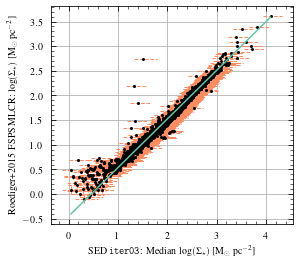

In [22]:
#
# Create array containing the lower and upper errors
#
sed_M_density_low_err = sed_M_density_50p - sed_M_density_16p
sed_M_density_high_err = sed_M_density_84p - sed_M_density_50p
log_sed_M_density_low_err = sed_M_density_low_err / (np.log(10) * sed_M_density_50p)
log_sed_M_density_high_err = sed_M_density_high_err / (np.log(10) * sed_M_density_50p)
log_sed_M_density_err_unequal = np.vstack(
    (log_sed_M_density_low_err.flatten(), log_sed_M_density_high_err.flatten())
)
#
# Scatter plot with asymmetric SED errors
#
fig, ax = plt.subplots()
ebar = ax.errorbar(
    x=log_sed_M_density_50p.flatten(),
    y=log_M_density.flatten(),
    xerr=log_sed_M_density_err_unequal,
    yerr=log_M_density_err.flatten(),
    fmt=".",
    markersize=4,
    color="k",
    ecolor="C1",
    elinewidth=1,
    capsize=0,
)
ebar[-1][0].set_linestyle("--")  # dashed error bars
ebar[-1][1].set_linestyle("--")  # dashed error bars
pu.add_lts_line(
    ax,
    slope,
    yint,
    pivot,
    lts_rms=None,
    lts_clip=None,
    xdata=log_sed_M_density_50p,
    lts_color="C0",
    zorder=10,
)
ax.set_xlabel(r"SED \texttt{iter03}: Median $\rm \log(\Sigma_\star)$ [$\rm M_\odot\; pc^{-2}$]")
ax.set_ylabel(r"Roediger+2015 FSPS MLCR: $\rm \log(\Sigma_\star)$ [$\rm M_\odot\; pc^{-2}$]")
ax.set_aspect("equal")
# fig.savefig(galpath + f"{galaxy}_RoedigerMLi_vs_SED_iter03_scatter.pdf")
plt.show()


Saved plot to /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_RoedigerMLi_vs_SED_iter03_kde.pdf!


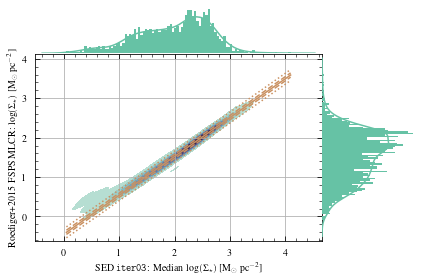

In [23]:
# 
# Joint contour plot
# 
pu.joint_contour_plot(
    log_sed_M_density_50p.flatten(),
    log_M_density.flatten(),
    plot_lts=True,
    lts_slope=slope,
    lts_int=yint,
    lts_pivot=pivot,
    lts_rms=rms,
    lts_clip=clip,
    fig_xlabel=r"SED \texttt{iter03}: Median $\rm \log(\Sigma_\star)$ [$\rm M_\odot\; pc^{-2}$]",
    fig_ylabel=r"Roediger+2015 FSPS MLCR: $\rm \log(\Sigma_\star)$ [$\rm M_\odot\; pc^{-2}$]",
    plot_scatter=False,
    # fig_savename=galpath + f"{galaxy}_RoedigerMLi_vs_SED_iter03_kde.pdf",
)

## MAP $M_\star$ from `iter02` of Prospector vs. `iter03`

Note that "MAP" = maximum a posteriori


In [65]:
# 
# Nyquist resolution. Units of K.km/s
# (just to get shape of Nyquist-sampled data and scale of pixels)
# 
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/nyquistPix/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_np_round_mom0_Kkms-1.fits"
# Ico_unc_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/nyquistPix/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_np_round_mom0_unc.fits"  # uncertainty
Ico_data, co_header = fits.getdata(Ico_path, header=True)
# Ico_unc = fits.getdata(Ico_unc_path)  # uncertainty
co_wcs = WCS(co_header)
#
# Load SED fitting results
# 
iter02_results = fu.load_sed_results(
    f"/arc/home/IsaacCheng/coop_f2021/sed_fits/NGC4380_Nyquist/iter02/",  # Nyquist
    1763,
    skip=[689]
)
iter03_results = fu.load_sed_results(
    f"/arc/home/IsaacCheng/coop_f2021/sed_fits/NGC4380_Nyquist/iter03/",  # Nyquist
    1763,
    skip=[783]
)
#
# Unpack SED-fitting results
# 
iter02_coords = iter02_results[:, 0].reshape(*nyquist_shape).astype(int)  # no transpose needed
iter02_mass_MAP = iter02_results[:, 3].reshape(*nyquist_shape)  # stellar mass MAP
iter03_coords = iter03_results[:, 0].reshape(*nyquist_shape).astype(int)  # no transpose needed
iter03_mass_MAP = iter03_results[:, 3].reshape(*nyquist_shape)  # stellar mass MAP
# 
# Convert stellar mass to stellar mass density
# 
px_dimensions, _ = fu.calc_pc_per_px(co_wcs, galdist, dist_err=None)  # parsecs
px_area = px_dimensions[0] * px_dimensions[1]  # square parsecs
iter02_M_density_MAP = iter02_mass_MAP / px_area  # solar masses per square parsec
iter03_M_density_MAP = iter03_mass_MAP / px_area  # solar masses per square parsec


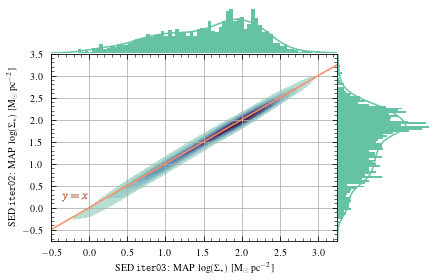

In [86]:
#
# Joint contour plot
#
fig, ax, ax_r, ax_t = pu.joint_contour_plot(
    np.log10(iter03_M_density_MAP).flatten(),
    np.log10(iter02_M_density_MAP).flatten(),
    plot_lts=False,
    fig_xlim=(-0.5, 3.25),
    fig_ylim=(-0.75, 3.5),
    fig_xlabel=r"SED \texttt{iter03}: MAP $\rm \log(\Sigma_\star)$ [$\rm M_\odot\; pc^{-2}$]",
    fig_ylabel=r"SED \texttt{iter02}: MAP $\rm \log(\Sigma_\star)$ [$\rm M_\odot\; pc^{-2}$]",
    plt_show=False,
)
ax.plot(np.linspace(-0.5, 3.25, 10), np.linspace(-0.5, 3.25, 10), c="C1")  # plot y=x
text = ax.text(-0.35, 0.2, "$y=x$", color="C1", fontsize=12)
text.set_path_effects(  # black outline around text
    [mpl.patheffects.Stroke(linewidth=0.2, foreground="black"), mpl.patheffects.Normal()]
)
# fig.savefig(galpath + f"{galaxy}_MAP_SED_iter02_vs_iter03.pdf")
plt.show()


## Median age from `iter02` of Prospector vs. `iter03`

N.B. "age" = $t$ = time of star formation

The uncertainties are gigantic!


In [120]:
#
# Load SED fitting results
#
iter02_results = fu.load_sed_results(
    f"/arc/home/IsaacCheng/coop_f2021/sed_fits/NGC4380_Nyquist/iter02/",  # Nyquist
    1763,
    skip=[689],
)
iter03_results = fu.load_sed_results(
    f"/arc/home/IsaacCheng/coop_f2021/sed_fits/NGC4380_Nyquist/iter03/",  # Nyquist
    1763,
    skip=[783],
)
#
# Unpack SED-fitting results
#
iter02_coords = (
    iter02_results[:, 0].reshape(*nyquist_shape).astype(int)
)  # no transpose needed
iter02_age_p50 = iter02_results[:, 16].reshape(*nyquist_shape)  # median SF age
iter02_age_p16 = iter02_results[:, 17].reshape(*nyquist_shape)  # 16th percentile
iter02_age_p84 = iter02_results[:, 18].reshape(*nyquist_shape)  # 84th percentile
iter03_coords = (
    iter03_results[:, 0].reshape(*nyquist_shape).astype(int)
)  # no transpose needed
iter03_age_p50 = iter03_results[:, 20].reshape(*nyquist_shape)  # median SF age
iter03_age_p16 = iter03_results[:, 21].reshape(*nyquist_shape)  # 16th percentile
iter03_age_p84 = iter03_results[:, 22].reshape(*nyquist_shape)  # 84th percentile
#
# Make uncertainty arrays
#
# Symmetric errorbars
iter02_age_err_equal = 0.5 * (iter02_age_p84 - iter02_age_p16)
iter03_age_err_equal = 0.5 * (iter03_age_p84 - iter03_age_p16)
# Asymmetric errorbars
iter02_age_err_low = iter02_age_p50 - iter02_age_p16
iter02_age_err_high = iter02_age_p84 - iter02_age_p50
iter02_age_err_unequal = np.vstack(
    (iter02_age_err_low.flatten(), iter02_age_err_high.flatten())
)
iter03_age_err_low = iter03_age_p50 - iter03_age_p16
iter03_age_err_high = iter03_age_p84 - iter03_age_p50
iter03_age_err_unequal = np.vstack(
    (iter03_age_err_low.flatten(), iter03_age_err_high.flatten())
)
# Mask for bad data since LTS cannot handle NaNs or infs
isgood_age = (
    np.isfinite(iter02_age_p50)
    & np.isfinite(iter02_age_err_equal)
    & np.isfinite(iter03_age_p50)
    & np.isfinite(iter03_age_err_equal)
)


sig_int:     0.0000     -0.9988
No intrinsic scatter or errors overestimated
Repeat at best fitting solution
sig_int:     0.0000     -0.9988
################# Values and formal errors ################
 intercept:  9.47 +/- 0.13
     slope:  1.04 +/- 0.17
   scatter:  0. +/- 0.0
Observed rms scatter: 0.19
y = a + b*(x - pivot) with pivot = 8.473
Spearman r=0.79 and p=0
Pearson r=0.89 and p=0
##########################################################
seconds 2.99
Actual y-intercept: 0.6820982911281916 \pm 1.478831223630388


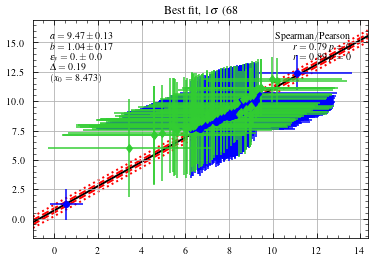

In [121]:
# 
# LTS-fitting
# 
pivot = np.median(iter03_age_p50[isgood_age])
clip = 2.6
popt = lts_linefit(
    iter03_age_p50[isgood_age],
    iter02_age_p50[isgood_age],
    iter03_age_err_equal[isgood_age],
    iter02_age_err_equal[isgood_age],
    clip=clip,
    epsy=True,
    corr=True,
    frac=None,
    pivot=pivot,
    plot=True,
    text=True,
)
yint, slope = popt.ab
yint_err, slope_err = popt.ab_err
rms = popt.rms
corr_yint = yint - slope * pivot
corr_yint_err = np.sqrt(yint_err ** 2 + (slope_err * pivot) ** 2)
print("Actual y-intercept:", corr_yint, r"\pm", corr_yint_err)

Slope: $1.04 \pm 0.17$, y-intercept: $0.7 \pm 1.5$

Interpretation: star formation in both models increase roughly the same, except the fit
without dust in the galaxy assumes slightly older stars than the fit where dust is a free
parameter (or not, since the y-intercept is consistent with zero). Does this make
qualitatively make sense? I have no idea since I have no prior exposure to this concept.
 

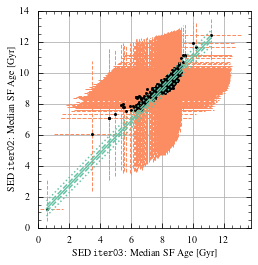

In [122]:
#
# Scatter plot with asymmetric SED errors
#
fig, ax = plt.subplots()
ebar = ax.errorbar(
    x=iter03_age_p50.flatten(),
    y=iter02_age_p50.flatten(),
    xerr=iter03_age_err_unequal,
    yerr=iter02_age_err_unequal,
    fmt=".",
    markersize=4,
    color="k",
    ecolor="C1",
    elinewidth=1,
    capsize=0,
)
ebar[-1][0].set_linestyle("--")  # dashed error bars
ebar[-1][1].set_linestyle("--")  # dashed error bars
pu.add_lts_line(
    ax,
    slope,
    yint,
    pivot,
    lts_rms=rms,
    lts_clip=clip,
    xdata=iter03_age_p50,
    lts_color="C0",
    zorder=10,
)
ax.set_xlim(left=0)
ax.set_ylim(0, 14)
ax.set_xlabel(r"SED \texttt{iter03}: Median SF Age [Gyr]")
ax.set_ylabel(r"SED \texttt{iter02}: Median SF Age [Gyr]")
ax.set_aspect("equal")
# fig.savefig(galpath + f"{galaxy}_P50age_SED_iter02_vs_iter03_scatter.pdf")
plt.show()

Since the uncertainties are so large, I wouldn't look too closely at the following KDE
plot since it does not capture the magnitude of the random errors.

It is interesting, however, that the median ages 


Saved plot to /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_P50age_SED_iter02_vs_iter03_kde.pdf!


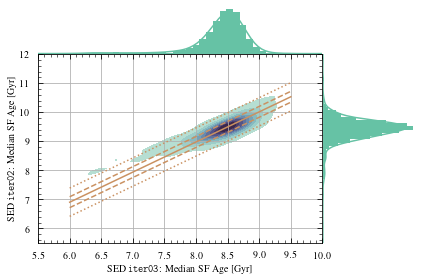

In [123]:
# 
# Joint contour plot
# 
pu.joint_contour_plot(
    iter03_age_p50.flatten(),
    iter02_age_p50.flatten(),
    plot_lts=True,
    lts_slope=slope,
    lts_yint=yint,
    lts_pivot=pivot,
    lts_rms=rms,
    lts_clip=clip,
    lts_xlim=(6, 9.5),
    fig_xlim=(5.5, 10),
    fig_ylim=(5.5, 12),
    fig_xlabel=r"SED \texttt{iter03}: Median SF Age [Gyr]",
    fig_ylabel=r"SED \texttt{iter02}: Median SF Age [Gyr]",
    plot_scatter=False,
    # ax_aspect="equal",
    # fig_savename=galpath + f"{galaxy}_P50age_SED_iter02_vs_iter03_kde.pdf",
)

# Gas Fraction Plot

N.B. Should be using the 9 arcsec beam + 2 arcsec pixel resolution VERTICO + NGVS data.
This reveals more spatially resolved details than Nyquist-resolution data and, since it is
not a scatter plot, we do not have to worry about the same "over-emphasis" problem that a
scatter plot would face (cf. the molecular gas main sequence plots).


In [1]:
# Need to switch directories if using VS Code + sshfs
galaxy = "NGC4380"
galpath = f"/arc/home/IsaacCheng/coop_f2021/galaxies/{galaxy}/"
%cd "$galpath"
# 
import astropy.units as u
import dill
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
# 
# Load my own packages
# 
import sys
sys.path.append("/arc/home/IsaacCheng/coop_f2021/packages")
import fits_utils as fu
import plot_utils as pu
import radial_profile_utils as rpu
# Reload my packages
import importlib
importlib.reload(fu)
importlib.reload(pu)
importlib.reload(rpu)
# 
galdist = 16.5 * u.Mpc  # distance to centre of Virgo cluster. Assume 10% uncertainty

/arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380


In [2]:
# 
# Load VERTICO Data
# 
# 9 arcsec beam, 2 arcsec pixels. Units of K.km/s
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_Kkms-1.fits"
Ico_unc_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_unc.fits"  # uncertainty
Ico_data, co_header = fits.getdata(Ico_path, header=True)
Ico_unc = fits.getdata(Ico_unc_path)  # uncertainty
co_wcs = WCS(co_header)
# Mask background
Ico_mask = (~np.isfinite(Ico_unc)) | (Ico_unc <= 0)
Ico_data[Ico_mask] = np.nan
Ico_unc[Ico_mask] = np.nan
# 
# Convert to gas surface density
# 
alpha_co = 4.35  # M_sun/pc^2 per (K km/s)
R_21 = 0.8  # dimensionless. CO(2-1)/CO(1-0) ratio
gas_density_uncorr = alpha_co * R_21 * Ico_data
gas_density_err_uncorr = alpha_co * R_21 * Ico_unc
# 
# Correct for inclination
# 
inclination = 61  # degrees. From Table 1 of Brown et al. (2021)
gas_density = rpu.correct_for_i(
    gas_density_uncorr, inclination, i_threshold=80, i_replacement=80
)
gas_density_err = rpu.correct_for_i(
    gas_density_err_uncorr, inclination, i_threshold=80, i_replacement=80
)
# 
# Load 9 arcsec beam. 2 arcsec px resolution optical data
# 
gband_infile = galpath + f"{galaxy}_regBin_gband_9as.pkl"
with open(gband_infile, "rb") as f:
    file = dill.load(f)
    gband_signal = file["signal_binned"]
    gband_noise = file["noise_binned"]
    nine_arcsec_wcs = file["wcs_binned"]
    nine_arcsec_wcs.array_shape = file["wcs_binned_array_shape"]
iband_infile = galpath + f"{galaxy}_regBin_iband_9as.pkl"
with open(iband_infile, "rb") as f:
    file = dill.load(f)
    iband_signal = file["signal_binned"]
    iband_noise = file["noise_binned"]
nine_arcsec_shape = gband_signal.shape
# 
# Taylor+2011 stellar mass estimates
# 
results, errors = fu.MLi_taylor2011(
    gband_signal,
    iband_signal,
    galdist,
    nine_arcsec_wcs,
    gband_err=gband_noise,
    iband_err=iband_noise,
    px_per_bin=1,
)
avg_iband_abs_mag, gi_colour, Li, MLi_ratio, M, M_density = results
avg_iband_abs_mag_err, gi_colour_err, Li_err, MLi_ratio_err, M_err, M_density_err = errors
# 
# Calculate gas fraction
# 
gas_fraction, gas_fraction_err = fu.calc_gas_fraction(
    gas_density, M_density, gas_density_err, M_density_err
)
isgood_gas_fraction = np.isfinite(gas_fraction) & np.isfinite(gas_fraction_err)
# 
# Save gas fraction values
# 
gas_fraction_outfile = galpath + f"{galaxy}_regBin_TaylorMLi_gasFrac_9as.pkl"
with open(gas_fraction_outfile, "wb") as f:
    dill.dump(
        {
            "note": "Molecular gas density is corrected for inclination, "
                    + "stellar mass density estimated using Taylor+2011 prescription",
            "gas_fraction": gas_fraction,
            "gas_fraction_err": gas_fraction_err,
            "co_header": co_header,
            "wcs_binned": nine_arcsec_wcs,
            "wcs_binned_array_shape": nine_arcsec_wcs.array_shape
        },
        f
    )
print("Pickled", gas_fraction_outfile)

Pickled /arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380/NGC4380_regBin_TaylorMLi_gasFrac_9as.pkl


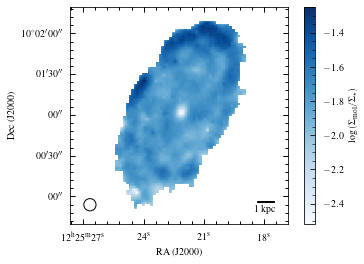

In [6]:
# 
# Plot
# 
fig, ax = plt.subplots(subplot_kw={"projection": co_wcs})
img = ax.imshow(gas_fraction, cmap="Blues", vmin=None, vmax=None)
cbar = fig.colorbar(img, ax=ax)
cbar.set_label(r"$\rm \log\left(\Sigma_{mol} / \rm \Sigma_{\star}\right)$")
pu.add_scalebar(ax, co_wcs, galdist)
pu.add_scalebeam(ax, co_header)
ax.set_xlabel("RA (J2000)")
ax.set_ylabel("Dec (J2000)")
ax.grid(False)
ax.set_aspect("equal")
# fig.savefig(galpath + f"{galaxy}_gas_fraction.pdf")
plt.show()

# Molecular Gas Main Sequence Plot

N.B. Should be using the Nyquist resolution VERTICO data + the NGVS data regularly binned
to VERTICO's Nyquist resolution. This is to prevent over-emphasis of trends that may just
be an artifact of the spaxels' correlations.


In [1]:
# Need to switch directories if using VS Code + sshfs
galaxy = "NGC4380"
galpath = f"/arc/home/IsaacCheng/coop_f2021/galaxies/{galaxy}/"
%cd "$galpath"
# 
import astropy.units as u
import dill
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from astropy.io import fits
from astropy.wcs import WCS
from ltsfit.lts_linefit import lts_linefit
# 
# Load my own packages
# 
import sys
sys.path.append("/arc/home/IsaacCheng/coop_f2021/packages")
import fits_utils as fu
import plot_utils as pu
import radial_profile_utils as rpu
# Reload my packages
import importlib
importlib.reload(fu)
importlib.reload(pu)
importlib.reload(rpu)
# 
galdist = 16.5 * u.Mpc  # distance to centre of Virgo cluster. Assume 10% uncertainty

/arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380


In [2]:
# 
# Load VERTICO Data
# 
# Nyquist resolution. Units of K.km/s
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/nyquistPix/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_np_round_mom0_Kkms-1.fits"
Ico_unc_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/nyquistPix/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_np_round_mom0_unc.fits"  # uncertainty
Ico_data, co_header = fits.getdata(Ico_path, header=True)
Ico_unc = fits.getdata(Ico_unc_path)  # uncertainty
co_wcs = WCS(co_header)
# Mask background
Ico_mask = (~np.isfinite(Ico_unc)) | (Ico_unc <= 0)
Ico_data[Ico_mask] = np.nan
Ico_unc[Ico_mask] = np.nan
# 
# Convert to gas surface density
# 
alpha_co = 4.35  # M_sun/pc^2 per (K km/s)
R_21 = 0.8  # dimensionless. CO(2-1)/CO(1-0) ratio
gas_density_uncorr = alpha_co / R_21 * Ico_data
gas_density_err_uncorr = alpha_co / R_21 * Ico_unc
# 
# Correct for inclination
# 
inclination = 61  # degrees. From Table 1 of Brown et al. (2021)
gas_density = rpu.correct_for_i(
    gas_density_uncorr, inclination, i_threshold=80, i_replacement=80
)
gas_density_err = rpu.correct_for_i(
    gas_density_err_uncorr, inclination, i_threshold=80, i_replacement=80
)
# 
# Get shape of Nyquist-sampled data
# 
gband_infile = galpath + f"{galaxy}_regBin_gband_nyquist.pkl"
with open(gband_infile, "rb") as f:
    file = dill.load(f)
    gband_signal = file["signal_binned"]
    nyquist_wcs = file["wcs_binned"]
    nyquist_wcs.array_shape = file["wcs_binned_array_shape"]
nyquist_shape = gband_signal.shape

In [3]:
sed_ver = "iter03"
#
# Load SED fitting results
# 
sed_results = fu.load_sed_results(
    f"/arc/home/IsaacCheng/coop_f2021/sed_fits/NGC4380_Nyquist/{sed_ver}/",  # Nyquist
    1763,
    skip=[783]
)
#
# Unpack SED-fitting results
# 
sed_coords = sed_results[:, 0].reshape(*nyquist_shape)  # no transpose needed
sed_mass_50p = sed_results[:, 4].reshape(*nyquist_shape).astype(float)  # median
sed_mass_16p = sed_results[:, 5].reshape(*nyquist_shape).astype(float)  # 16th percentile
sed_mass_84p = sed_results[:, 6].reshape(*nyquist_shape).astype(float)  # 84th percentile
# 
# Convert stellar mass to stellar mass density
# 
px_dimensions, _ = fu.calc_pc_per_px(nyquist_wcs, galdist, dist_err=None)  # parsecs
px_area = px_dimensions[0] * px_dimensions[1]  # square parsecs
sed_M_density_50p = sed_mass_50p / px_area  # solar masses per square parsec
sed_M_density_16p = sed_mass_16p / px_area  # solar masses per square parsec
sed_M_density_84p = sed_mass_84p / px_area  # solar masses per square parsec
sed_M_density_err_equal = 0.5 * (sed_M_density_84p - sed_M_density_16p)

In [4]:
#
# Take log10 of data (for plots & LTS fitting)
#
log_sed_M_density_50p = np.log10(sed_M_density_50p)
log_sed_M_density_err_equal = sed_M_density_err_equal / (np.log(10) * sed_M_density_50p)
log_gas_density = np.log10(gas_density)
log_gas_density_err = gas_density_err / (np.log(10) * gas_density)
isgood_mgms = (
    np.isfinite(log_sed_M_density_50p)
    & np.isfinite(log_sed_M_density_err_equal)
    & np.isfinite(log_gas_density)
    & np.isfinite(log_gas_density_err)
)

In this case, *we turn off outlier detection* (or else LTS fitting fails terribly). We set
our pivot to be the median of the x-data (i.e., the stellar mass densities). The solid
line in our joint contour plot shows the LTS line of best fit---the molecular gas main
sequence (MGMS). The dashed lines indicates the region enclosing 68% (1 sigma) of the data
and the dotted lines enclose 99% (2.6 sigma) of the data.


sig_int:     0.0000      0.6351
Computing sig_int
sig_int:     0.0000      0.6351
sig_int:     0.4194     -0.6703
sig_int:     0.2041     -0.0486
sig_int:     0.1896      0.0244
sig_int:     0.1944     -0.0003
sig_int:     0.1943      0.0002
Computing sig_int error
sig_int:     0.1943      0.0452
sig_int:     0.4194     -0.6253
sig_int:     0.2095     -0.0300
sig_int:     0.2034     -0.0004
sig_int:     0.2033      0.0001
Repeat at best fitting solution
sig_int:     0.1943      0.0002
################# Values and formal errors ################
 intercept:  0.3894 +/- 0.0087
     slope:  0.905 +/- 0.028
   scatter:  0.1943 +/- 0.0090
Observed rms scatter: 0.28
y = a + b*(x - pivot) with pivot = 2.426
Spearman r=0.72 and p=1.9e-159
Pearson r=0.62 and p=4.4e-107
##########################################################
seconds 0.02


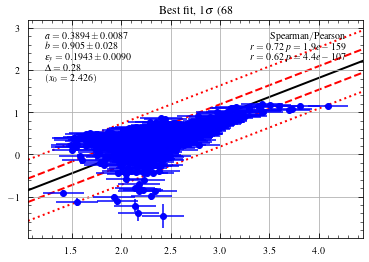

In [5]:
# 
# LTS fitting
# 
pivot = np.median(log_sed_M_density_50p[isgood_mgms])  # no difference if we use mean
clip = 2.6
popt = lts_linefit(
    log_sed_M_density_50p[isgood_mgms],
    log_gas_density[isgood_mgms],
    log_sed_M_density_err_equal[isgood_mgms],
    log_gas_density_err[isgood_mgms],
    clip=clip,
    epsy=True,
    corr=True,
    # frac=None,  # turn on outlier detection
    frac=1,  # turn off outlier detection
    pivot=pivot,
    plot=True,
    text=True,
)
inter, slope = popt.ab
inter_err, slope_err = popt.ab_err
rms = popt.rms

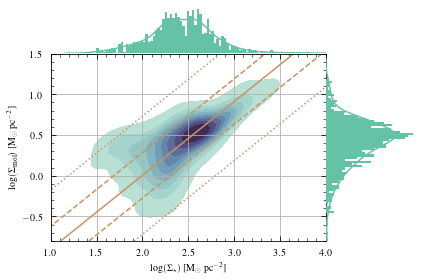

In [6]:
pu.joint_contour_plot(
    log_sed_M_density_50p[isgood_mgms],
    log_gas_density[isgood_mgms],
    plot_lts=True,
    lts_slope=slope,
    lts_int=inter,
    lts_pivot=pivot,
    lts_rms=rms,
    lts_clip=clip,
    lts_xlim=(-1, 4),
    fig_xlim=(1.0, 4.0),
    fig_ylim=(-0.8, 1.5),
    fig_xlabel=r"$\rm \log(\Sigma_{\star})$ [$\rm M_\odot\; pc^{-2}$]",
    fig_ylabel=r"$\rm \log(\Sigma_{mol})$ [$\rm M_\odot\; pc^{-2}$]",
    plot_scatter=False,
    # fig_savename=galpath + f"{galaxy}_MGMS_SED_{sed_ver}.pdf",
)

## Check what regions correspond to 1 sigma above/below MGMS


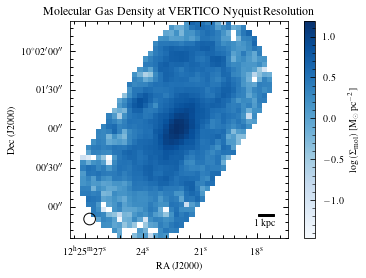

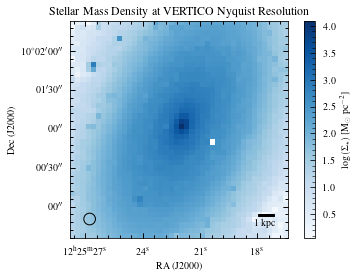

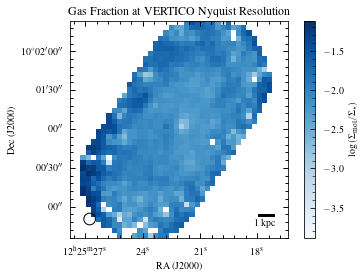

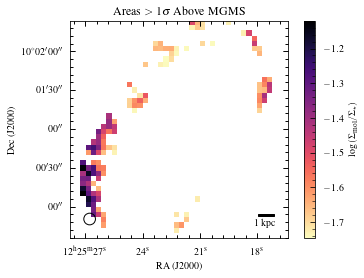

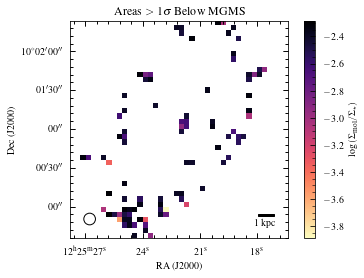

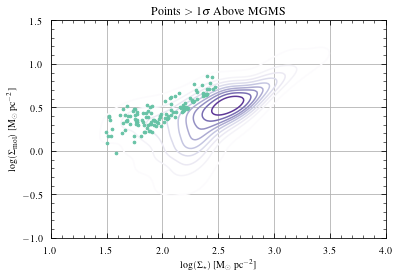

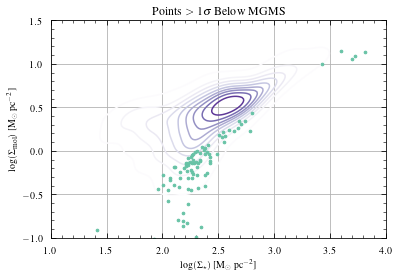

In [7]:
is_above_mgms = log_gas_density > (inter + slope * (log_sed_M_density_50p - pivot) + rms)
is_below_mgms = log_gas_density < (inter + slope * (log_sed_M_density_50p - pivot) - rms)
gas_fraction = np.log10(gas_density / sed_M_density_50p)
gas_fraction_above_mgms = np.copy(gas_fraction)
gas_fraction_above_mgms[(~is_above_mgms) | (~isgood_mgms)] = np.nan
gas_fraction_below_mgms = np.copy(gas_fraction)
gas_fraction_below_mgms[(~is_below_mgms) | (~isgood_mgms)] = np.nan
# 
# Plot
# 
# Gas density at Nyquist resolution
fig, ax = plt.subplots(subplot_kw={"projection": co_wcs})
img = ax.imshow(log_gas_density, cmap="Blues", vmin=None, vmax=None)
cbar = fig.colorbar(img, ax=ax)
cbar.set_label(r"$\rm \log\left(\Sigma_{mol}\right)$ [$\rm M_\odot\; pc^{-2}$]")
pu.add_scalebar(ax, co_wcs, galdist)
pu.add_scalebeam(ax, co_header)
ax.set_xlabel("RA (J2000)")
ax.set_ylabel("Dec (J2000)")
ax.grid(False)
ax.set_aspect("equal")
ax.set_title(r"Molecular Gas Density at VERTICO Nyquist Resolution")
plt.show()
# Stellar mass density at Nyquist resolution
fig, ax = plt.subplots(subplot_kw={"projection": co_wcs})
img = ax.imshow(log_sed_M_density_50p, cmap="Blues", vmin=None, vmax=None)
cbar = fig.colorbar(img, ax=ax)
cbar.set_label(r"$\rm \log\left(\Sigma_{\star}\right)$ [$\rm M_\odot\; pc^{-2}$]")
pu.add_scalebar(ax, co_wcs, galdist)
pu.add_scalebeam(ax, co_header)
ax.set_xlabel("RA (J2000)")
ax.set_ylabel("Dec (J2000)")
ax.grid(False)
ax.set_aspect("equal")
ax.set_title(r"Stellar Mass Density at VERTICO Nyquist Resolution")
plt.show()
# Gas fraction at Nyquist resolution
fig, ax = plt.subplots(subplot_kw={"projection": co_wcs})
img = ax.imshow(gas_fraction, cmap="Blues", vmin=None, vmax=None)
cbar = fig.colorbar(img, ax=ax)
cbar.set_label(r"$\rm \log\left(\Sigma_{mol} / \rm \Sigma_{\star}\right)$")
pu.add_scalebar(ax, co_wcs, galdist)
pu.add_scalebeam(ax, co_header)
ax.set_xlabel("RA (J2000)")
ax.set_ylabel("Dec (J2000)")
ax.grid(False)
ax.set_aspect("equal")
ax.set_title(r"Gas Fraction at VERTICO Nyquist Resolution")
plt.show()
# Regions > 1 sigma above MGMS (map)
fig, ax = plt.subplots(subplot_kw={"projection": co_wcs})
img = ax.imshow(gas_fraction_above_mgms, cmap="magma_r", vmin=None, vmax=None)
cbar = fig.colorbar(img, ax=ax)
cbar.set_label(r"$\rm \log\left(\Sigma_{mol} / \rm \Sigma_{\star}\right)$")
pu.add_scalebar(ax, co_wcs, galdist)
pu.add_scalebeam(ax, co_header)
ax.set_xlabel("RA (J2000)")
ax.set_ylabel("Dec (J2000)")
ax.grid(False)
ax.set_aspect("equal")
ax.set_title(r"Areas $> 1 \sigma$ Above MGMS")
plt.show()
# Regions > 1 sigma below MGMS (map)
fig, ax = plt.subplots(subplot_kw={"projection": co_wcs})
img = ax.imshow(gas_fraction_below_mgms, cmap="magma_r", vmin=None, vmax=None)
cbar = fig.colorbar(img, ax=ax)
cbar.set_label(r"$\rm \log\left(\Sigma_{mol} / \rm \Sigma_{\star}\right)$")
pu.add_scalebar(ax, co_wcs, galdist)
pu.add_scalebeam(ax, co_header)
ax.set_xlabel("RA (J2000)")
ax.set_ylabel("Dec (J2000)")
ax.grid(False)
ax.set_aspect("equal")
ax.set_title(r"Areas $> 1 \sigma$ Below MGMS")
plt.show()
# Points > 1 sigma above MGMS (scatter plot)
fig, ax = plt.subplots()
sns.kdeplot(
    ax=ax,
    x=log_sed_M_density_50p[isgood_mgms],
    y=log_gas_density[isgood_mgms],
    cmap="Purples",
    fill=False
)
ax.scatter(
    log_sed_M_density_50p[(is_above_mgms) & (isgood_mgms)],
    log_gas_density[(is_above_mgms) & (isgood_mgms)],
    s=7,
    zorder=2
)
ax.set_xlabel(r"$\rm \log(\Sigma_{\star})$ [$\rm M_\odot\; pc^{-2}$]")
ax.set_ylabel(r"$\rm \log(\Sigma_{mol})$ [$\rm M_\odot\; pc^{-2}$]")
ax.set_title(r"Points $> 1 \sigma$ Above MGMS")
ax.set_xlim(1.0, 4.0)
ax.set_ylim(-1.0, 1.5)
plt.show()
# Points > 1 sigma below MGMS (scatter plot)
fig, ax = plt.subplots()
sns.kdeplot(
    ax=ax,
    x=log_sed_M_density_50p[isgood_mgms],
    y=log_gas_density[isgood_mgms],
    cmap="Purples",
    fill=False
)
ax.scatter(
    log_sed_M_density_50p[(is_below_mgms) & (isgood_mgms)],
    log_gas_density[(is_below_mgms) & (isgood_mgms)],
    s=7,
    zorder=2
)
ax.set_xlabel(r"$\rm \log(\Sigma_{\star})$ [$\rm M_\odot\; pc^{-2}$]")
ax.set_ylabel(r"$\rm \log(\Sigma_{mol})$ [$\rm M_\odot\; pc^{-2}$]")
ax.set_title(r"Points $> 1 \sigma$ Below MGMS")
ax.set_xlim(1.0, 4.0)
ax.set_ylim(-1.0, 1.5)
plt.show()

# Radial Profile Plots

Fit ellipses/annuli to some data.

We define the "radius" of an annulus as the arithmetic mean of the inner & outer
circularized radii. For an ellipse, the inner circularized radius is zero.

~~We omit NaNs and infs from all calculations and use the median value as the average.~~
We calculate the mean and include any non-detections (NaNs) as zeros to provide a
lower-bound estimate near the edges of the galaxy.

For high-inclination galaxies, we use slices that are 1 beam thick (or the size of the
worst PSF) aligned with the major axis. We calculate the mean and omit NaNs in this case.


In [1]:
# Need to switch directories if using VS Code + sshfs
galaxy = "NGC4380"
galpath = f"/arc/home/IsaacCheng/coop_f2021/galaxies/{galaxy}/"
%cd "$galpath"
# 
import astropy.coordinates as coord
import astropy.units as u
import dill
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import re
from astropy.io import fits
from astropy.wcs import WCS
# 
# Load my own packages
# 
import sys
sys.path.append("/arc/home/IsaacCheng/coop_f2021/packages")
import fits_utils as fu
import plot_utils as pu
import radial_profile_utils as rpu
from radial_profile import RadialProfile
# Reload my packages
import importlib
importlib.reload(fu)
importlib.reload(pu)
importlib.reload(rpu)
# 
galdist = 16.5 * u.Mpc  # distance to centre of Virgo cluster. Assume 10% uncertainty

/arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380


## Molecular Gas Data

Since data are background-subtracted, we fit ellipses/annuli until the SNR becomes
undefined. In other words, we fit until an annulus does not contain *any* detected gas.


In [2]:
# 
# Load VERTICO data
# 
# 9 arcsec beam, 2 arcsec pixels. Units of K.km/s
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_Kkms-1.fits"
Ico_unc_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_unc.fits"  # uncertainty
Ico_data, co_header = fits.getdata(Ico_path, header=True)
Ico_unc = fits.getdata(Ico_unc_path)  # uncertainty
co_wcs = WCS(co_header)
# Mask background
Ico_mask = (~np.isfinite(Ico_unc)) | (Ico_unc <= 0)
Ico_data[Ico_mask] = np.nan
Ico_unc[Ico_mask] = np.nan
# 
# Convert to gas surface density
# 
alpha_co = 4.35  # M_sun/pc^2 per (K km/s)
R_21 = 0.8  # dimensionless. CO(2-1)/CO(1-0) ratio
gas_density_uncorr = alpha_co * R_21 * Ico_data
gas_density_err_uncorr = alpha_co * R_21 * Ico_unc
# 
# Galaxy data from Table 1 of Brown et al. (2021)
# 
# CENTER = coord.SkyCoord(
#     ra="12h25m22.16s", dec="+10d01m00.12s", frame=co_header["RADESYS"].lower()
# )
CENTER = co_wcs.pixel_to_world(Ico_data.shape[1] / 2, Ico_data.shape[0] / 2)
INCLINATION = 61  # degrees
PA = 158  # position angle, degrees
I_THRESHOLD = 80  # degrees, INCLINATION >= I_THRESHOLD => high-inclination

In [3]:
radial_profile_func = "mean"
include_bad = True if INCLINATION < I_THRESHOLD else False
# 
# Initialize RadialProfile object
# 
galaxy_no_rp = RadialProfile(
    gas_density_uncorr, CENTER, INCLINATION, PA, noise=gas_density_err_uncorr
)
# 
# Generate radial profile
# 
galaxy_rp_uncorr = galaxy_no_rp.calc_radial_profile(
    n_annuli=4,
    # snr_cutoff=0,
    max_snr_annuli=40,
    header=co_header,
    include_bad=include_bad,
    func=radial_profile_func,
    debug_plot=False,
    is_radio=True,
    bootstrap_errs=True,  # estimates standard error on the mean/median
    n_bootstraps=100,
    bootstrap_seed=3141592654,  # for reproducibility. Does not affect global seed  
)
# 
# Correct for inclination
# 
galaxy_rp = galaxy_rp_uncorr.correct_for_i(i_replacement=80)


Getting minimum width from radio beam size
Min width/beam size (pixels): 4.50000000014364


In [4]:
# 
# Calculate uncertainty using Eq. (8) of Brown et al. (2021)
# 
galaxy_rp_data_areas, galaxy_rp_noise_areas = galaxy_rp.calc_area()
beam_major, beam_minor, _ = rpu.get_beam_size_px(co_header)
beam_area = np.pi * (beam_major / 2) * (beam_minor / 2)  # area of ellipse in pixel units
num_beams = galaxy_rp_data_areas / beam_area
# ? Should the following be dividing by sqrt(num_beams) ?
galaxy_rp_brown_unc = galaxy_rp.std_data * np.sqrt(num_beams)  # Eq. (8) of Brown+2021
# 
# Calculate standard error on the mean (assumes independent samples)
# 
standard_error = galaxy_rp.std_data / np.sqrt(galaxy_rp_data_areas)
# 
print("Uncertainty according to Brown+2021:\t\t", galaxy_rp_brown_unc)
print("Standard error if num samples = num beams:\t", galaxy_rp_brown_unc / num_beams)
print("Bootstrapped error on the mean/median:\t", galaxy_rp.avg_data_err)
print("Standard error on the mean/median:\t", standard_error)
# 
# Factor to convert radii from pixel units to kpc
# 
px_to_kpc = fu.calc_pc_per_px(co_wcs, galdist)[0][0] / 1000  # assume square pixels

Uncertainty according to Brown+2021:		 [15.91027087 11.2268057   7.884647   13.20968283]
Standard error if num samples = num beams:	 [1.92836309 0.45357195 0.19112764 0.22872076]
Bootstrapped error on the mean/median:	 [0.56447247 0.12926741 0.0533655  0.07165726]
Standard error on the mean/median:	 [0.48353883 0.11373359 0.04792543 0.05735194]


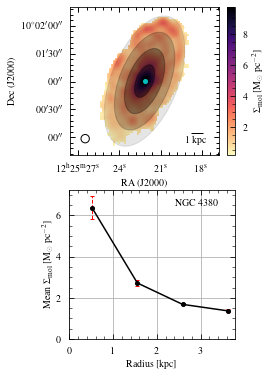

In [6]:
# 
# Plot
#
fig = plt.figure(figsize=mpl.figure.figaspect(1.5))
ax1 = fig.add_subplot(2, 1, 1, projection=co_wcs)
#
# Plot data
#
img1 = ax1.imshow(galaxy_rp.data, cmap="magma_r")
cbar1 = fig.colorbar(img1, fraction=0.045)
cbar1.set_label(r"$\rm \Sigma_{mol}$ [$\rm M_\odot\; pc^{-2}$]")
# Mark centre
ax1.plot(*co_wcs.world_to_pixel(CENTER), "co", markersize=4)
# Add annuli
pu.add_annuli_RadialProfile(ax1, galaxy_rp, alpha_coeff=0.4)
# Add beam and scalebar
pu.add_scalebar(ax1, co_wcs, dist=galdist)
pu.add_beam(ax1, co_header, xy=(8, 9), edgecolor="k", fc="None", lw=1, zorder=2)
ax1.set_xlim(0, galaxy_rp.data.shape[1])
ax1.set_ylim(0, galaxy_rp.data.shape[0])
ax1.set_xlabel("RA (J2000)")
ax1.set_ylabel("Dec (J2000)")
ax1.grid(False)
ax1.set_aspect("equal")
#
ax2 = fig.add_subplot(2, 1, 2)
ebar2 = ax2.errorbar(
    x=galaxy_rp.radii * px_to_kpc,
    y=galaxy_rp.avg_data,
    # yerr=standard_error,  # standard error on the mean/median
    yerr=galaxy_rp.avg_data_err,  # uncertainty in the mean/median from bootstrapping
    # yerr=galaxy_rp_brown_unc,  # uncertainty using Eq. (8) of Brown et al. (2021)
    # yerr=galaxy_rp_brown_unc / num_beams,  # standard error if num samples = num beams
    fmt="-o",
    markersize=4,
    color="k",
    ecolor="r",
    elinewidth=1,
    capsize=2,
)
ebar2[-1][0].set_linestyle("--")
# 
# Add name of galaxy
# 
high_i_str = "*" if INCLINATION >= I_THRESHOLD else ""
ax2.text(
    0.9,
    0.9,
    re.sub(r"(\d+)", " \\1", galaxy) + high_i_str,
    c="k",
    ha="right",
    transform=ax2.transAxes,
)
ax2.set_xlabel("Radius [kpc]")
ax2.set_ylabel(
    radial_profile_func.capitalize()
    + r" $\rm \Sigma_{mol}$ [$\rm M_\odot\; pc^{-2}$]"
)
ax2.set_xlim(left=0)
ax2.set_ylim(bottom=0)
# ax2.semilogy()
#
fig.tight_layout(pad=3.5)
# fig.savefig(galpath + f"{galaxy}_gasDensity_radProf_4annuli.pdf")
plt.show()

## Version for beamer slides


/opt/conda/lib/python3.8/contextlib.py:113: UserWarning: Style includes a parameter, 'backend', that is not related to style.  Ignoring
  return next(self.gen)


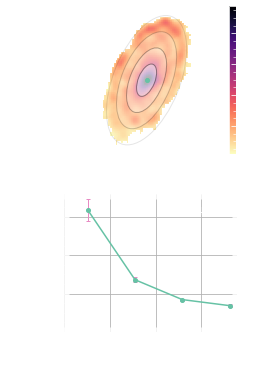

/opt/conda/lib/python3.8/contextlib.py:113: UserWarning: Style includes a parameter, 'backend', that is not related to style.  Ignoring
  return next(self.gen)


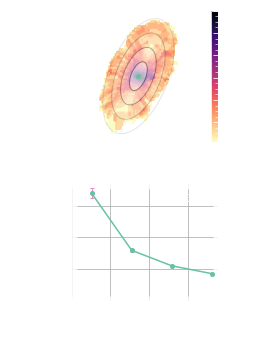

In [8]:
# 
# Plot data
#
with plt.style.context("/arc/home/IsaacCheng/coop_f2021/stylesheets/beamer.mplstyle"):
    with plt.rc_context({"font.size" : 10}):  # temporaily decrease fontsizes
        fig = plt.figure(figsize=mpl.figure.figaspect(1.5))
        ax1 = fig.add_subplot(2, 1, 1, projection=co_wcs)
        #
        # Plot data
        #
        img1 = ax1.imshow(galaxy_rp.data, cmap="magma_r")
        cbar1 = fig.colorbar(img1, fraction=0.045)
        cbar1.set_label(r"$\rm \Sigma_{mol}$ [$\rm M_\odot\; pc^{-2}$]")
        # Mark centre
        ax1.plot(*co_wcs.world_to_pixel(CENTER), marker="o", color="C0", markersize=4)
        # Add annuli
        pu.add_annuli_RadialProfile(ax1, galaxy_rp, alpha_coeff=0.4,
                                    ls="-", edgecolor="k", fc="w", lw=1, zorder=2)
        # Add beam and scalebar
        pu.add_scalebar(ax1, co_wcs, dist=galdist, color="w")
        # pu.add_beam(ax1, co_header, xy=(8, 9), edgecolor="w", fc="None", lw=1, zorder=2)
        pu.add_scalebeam(ax1, galaxy_rp.rp_options["header"], ec="w")
        ax1.set_xlim(0, galaxy_rp.data.shape[1])
        ax1.set_ylim(0, galaxy_rp.data.shape[0])
        ax1.set_xlabel("RA (J2000)")
        ax1.set_ylabel("Dec (J2000)")
        ax1.grid(False)
        ax1.set_aspect("equal")
        ax1.coords[0].set_ticklabel(exclude_overlapping=True)
        #
        ax2 = fig.add_subplot(2, 1, 2)
        ebar2 = ax2.errorbar(
            x=galaxy_rp.radii * px_to_kpc,
            y=galaxy_rp.avg_data,
            yerr=galaxy_rp.avg_data_err,  # uncertainty in the mean/median from bootstrapping
            fmt="-o",
            markersize=4,
            color="C0",
            ecolor="C3",
            elinewidth=1,
            capsize=2,
        )
        # ebar2[-1][0].set_linestyle("--")
        # 
        # Add name of galaxy
        # 
        high_i_str = "*" if INCLINATION >= I_THRESHOLD else ""
        ax2.text(
            0.9,
            0.85,
            re.sub(r"(\d+)", " \\1", galaxy) + high_i_str,
            c="w",
            ha="right",
            transform=ax2.transAxes,
        )
        ax2.set_xlabel("Radius [kpc]")
        ax2.set_ylabel(
            radial_profile_func.capitalize()
            + r" $\rm \Sigma_{mol}$ [$\rm M_\odot\; pc^{-2}$]"
        )
        ax2.set_xticks([0, 1, 2, 3])
        ax2.set_ylim(bottom=0)
        pu.set_aspect(ax2, 0.8)
        #
        fig.tight_layout(pad=3.5)
        fig.savefig(galpath + f"{galaxy}_gasDensity_radProf_4annuli_beamer.pdf")
        plt.show()
        
# 
# Plot uncertainty
#
with plt.style.context("/arc/home/IsaacCheng/coop_f2021/stylesheets/beamer.mplstyle"):
    with plt.rc_context({"font.size" : 10}):  # temporaily decrease fontsizes
        fig = plt.figure(figsize=mpl.figure.figaspect(1.4))
        ax1 = fig.add_subplot(2, 1, 1, projection=co_wcs)
        #
        # Plot data
        #
        img1 = ax1.imshow(galaxy_rp.noise, cmap="magma_r")
        cbar1 = fig.colorbar(img1, fraction=0.045)
        cbar1.set_label(r"$\rm \Sigma_{mol}$ Uncertainty [$\rm M_\odot\; pc^{-2}$]")
        # Mark centre
        ax1.plot(*co_wcs.world_to_pixel(CENTER), marker="o", color="C0", markersize=4)
        # Add annuli
        pu.add_annuli_RadialProfile(ax1, galaxy_rp, alpha_coeff=0.4,
                                    ls="-", edgecolor="k", fc="w", lw=1, zorder=2)
        # Add beam and scalebar
        pu.add_scalebar(ax1, co_wcs, dist=galdist, color="w")
        # pu.add_beam(ax1, co_header, xy=(8, 9), edgecolor="w", fc="None", lw=1, zorder=2)
        pu.add_scalebeam(ax1, galaxy_rp.rp_options["header"], ec="w")
        ax1.set_xlim(0, galaxy_rp.data.shape[1])
        ax1.set_ylim(0, galaxy_rp.data.shape[0])
        ax1.set_xlabel("RA (J2000)")
        ax1.set_ylabel("Dec (J2000)")
        ax1.grid(False)
        ax1.set_aspect("equal")
        ax1.coords[0].set_ticklabel(exclude_overlapping=True)
        #
        ax2 = fig.add_subplot(2, 1, 2)
        ebar2 = ax2.errorbar(
            x=galaxy_rp.radii * px_to_kpc,
            y=galaxy_rp.avg_noise,
            yerr=galaxy_rp.avg_noise_err,  # uncertainty in the mean/median from bootstrapping
            fmt="-o",
            markersize=4,
            color="C0",
            ecolor="C3",
            elinewidth=1,
            capsize=2,
        )
        # ebar2[-1][0].set_linestyle("--")
        # 
        # Add name of galaxy
        # 
        high_i_str = "*" if INCLINATION >= I_THRESHOLD else ""
        ax2.text(
            0.9,
            0.85,
            re.sub(r"(\d+)", " \\1", galaxy) + high_i_str,
            c="w",
            ha="right",
            transform=ax2.transAxes,
        )
        ax2.set_xlabel("Radius [kpc]")
        ax2.set_ylabel(
            "Uncertainty in "
            + radial_profile_func.capitalize()
            + r" $\rm \Sigma_{mol}$ [$\rm M_\odot\; pc^{-2}$]"
        )
        ax2.set_xticks([0, 1, 2, 3])
        ax2.set_ylim(bottom=0)
        pu.set_aspect(ax2, 0.8)
        #
        fig.tight_layout(pad=3.5)
        fig.savefig(galpath + f"{galaxy}_gasDensity_radProfUnc_4annuli_beamer.pdf")
        plt.show()

## Directional radial profile for beamer slides


In [9]:
galaxy_drp = galaxy_rp.directional_radial_profile(
    angle=None,  # take direction to be along galaxy's major axis
    bootstrap_errs=True,
    bootstrap_seed=3141592654,
    results_to_1d=True,  # easier to plot radial profile this way
)

/opt/conda/lib/python3.8/contextlib.py:113: UserWarning: Style includes a parameter, 'backend', that is not related to style.  Ignoring
  return next(self.gen)


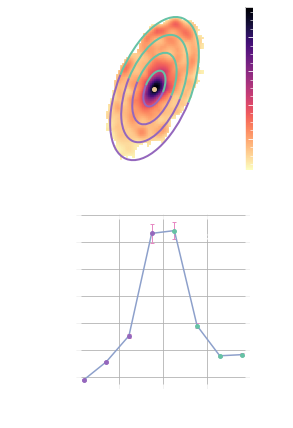

In [33]:
from matplotlib.patches import Arc, Ellipse
# 
# Plot
# 
with plt.style.context("/arc/home/IsaacCheng/coop_f2021/stylesheets/beamer.mplstyle"):
    with plt.rc_context({"font.size" : 10}):  # temporaily decrease fontsizes
        fig = plt.figure(figsize=mpl.figure.figaspect(1.7))
        ax1 = fig.add_subplot(2, 1, 1, projection=co_wcs)
        positive_color = "C0"
        negative_color = "tab:purple"
        #
        # Plot data
        #
        img1 = ax1.imshow(galaxy_drp.data, cmap="magma_r")
        ax1.plot(*galaxy_drp.annuli[0].positions, marker="o", color="C6", markersize=4)  # mark centre
        cbar1 = fig.colorbar(img1, fraction=0.045)
        cbar1.set_label(r"$\rm \Sigma_{mol}$ [$\rm M_\odot\; pc^{-2}$]")
        # Add annuli from outer to inner
        annuli = np.hstack((galaxy_drp.annuli[::-1], galaxy_drp.annuli))
        for num, annulus in enumerate(annuli):
            try:
                # EllipticalAnnulus attributes. N.B. height and width are switched from "normal"
                height = annulus.b_out
                width = annulus.a_out
            except AttributeError:
                # EllipticalAperture attributes. N.B. height and width are switched from "normal"
                height = annulus.b
                width = annulus.a
            if num >= len(annuli) / 2:
                # Positive radii annuli
                edgecolor = positive_color
                arcangle = (np.rad2deg(annulus.theta) + 180) % 360.0
            else:
                # Negative radii annuli
                edgecolor = negative_color
                arcangle = np.rad2deg(annulus.theta) % 360.0
            arc = Arc(
                xy=annulus.positions,
                width=width * 2,  # full major/minor axis
                height=height * 2,  # full major/minor axis
                angle=arcangle,
                theta1=-90,
                theta2=90,
                ls="-",
                edgecolor=edgecolor,
                alpha=1,
                lw=2,
                zorder=2,
            )
            ax1.add_patch(arc)
        # Add beam size
        pu.add_scalebar(ax1, co_wcs, dist=galdist, color="w")
        # pu.add_beam(ax1, co_header, xy=(8, 9), edgecolor="w", fc="None", lw=1, zorder=2)
        pu.add_scalebeam(ax1, galaxy_drp.rp_options["header"], ec="w")
        ax1.set_xlim(0, galaxy_drp.data.shape[1])
        ax1.set_ylim(0, galaxy_drp.data.shape[0])
        ax1.set_xlabel("RA (J2000)")
        ax1.set_ylabel("Dec (J2000)")
        ax1.grid(False)
        ax1.set_aspect("equal")
        ax1.coords[0].set_ticklabel(exclude_overlapping=True)
        #
        ax2 = fig.add_subplot(2, 1, 2)
        radii = galaxy_drp.drp_results["radii"]
        # Plot negative radii data
        ax2.scatter(
            x=radii[radii < 0] * px_to_kpc,
            y=galaxy_drp.drp_results["avg_data"][radii < 0],
            c=negative_color,
            s=15,
            zorder=3,
        )
        # Plot positive radii data
        ax2.scatter(
            x=radii[radii > 0] * px_to_kpc,
            y=galaxy_drp.drp_results["avg_data"][radii > 0],
            c=positive_color,
            s=15,
            zorder=3,
        )
        # Plot errorbars
        ebar2 = ax2.errorbar(
            x=galaxy_drp.drp_results["radii"] * px_to_kpc,
            y=galaxy_drp.drp_results["avg_data"],
            yerr=galaxy_drp.drp_results["avg_data_err"],  # uncertainty from bootstrapping
            fmt="-",
            color="C1",
            ecolor="C3",
            elinewidth=1,
            capsize=2,
        )
        # Add name of galaxy
        high_i_str = "*" if INCLINATION >= I_THRESHOLD else ""
        ax2.text(
            0.9,
            0.85,
            re.sub(r"(\d+)", " \\1", galaxy) + high_i_str,
            c="w",
            ha="right",
            transform=ax2.transAxes,
        )
        ax2.set_xlabel("Radius [kpc]")
        ax2.set_ylabel(
            radial_profile_func.capitalize()
            + r" $\rm \Sigma_{mol}$ [$\rm M_\odot\; pc^{-2}$]"
        )
        pu.set_aspect(ax2, 1)
        #
        fig.tight_layout(pad=3.5)
        # fig.savefig(galpath + f"{galaxy}_gasDensity_directionalRadProf_4annuli_beamer.pdf")
        plt.show()


## Stellar Mass Data (9 arcsec beam, 2 arcsec pixel resolution)


In [2]:
# 
# Load 9 arcsec beam. 2 arcsec px resolution optical data
# 
gband_infile = galpath + f"{galaxy}_regBin_gband_9as.pkl"
with open(gband_infile, "rb") as f:
    file = dill.load(f)
    gband_signal = file["signal_binned"]
    gband_noise = file["noise_binned"]
    nine_arcsec_wcs = file["wcs_binned"]
    nine_arcsec_wcs.array_shape = file["wcs_binned_array_shape"]
iband_infile = galpath + f"{galaxy}_regBin_iband_9as.pkl"
with open(iband_infile, "rb") as f:
    file = dill.load(f)
    iband_signal = file["signal_binned"]
    iband_noise = file["noise_binned"]
nine_arcsec_shape = gband_signal.shape
# 
# Taylor+2011 stellar mass estimates
# 
results, errors = fu.MLi_taylor2011(
    gband_signal,
    iband_signal,
    galdist,
    nine_arcsec_wcs,
    gband_err=gband_noise,
    iband_err=iband_noise,
    px_per_bin=1,
)
avg_iband_abs_mag, gi_colour, Li, MLi_ratio, M, M_density = results
avg_iband_abs_mag_err, gi_colour_err, Li_err, MLi_ratio_err, M_err, M_density_err = errors
# 
# Galaxy data from Table 1 of Brown et al. (2021)
# 
# Need header of VERTICO data for reference frame. Should be "fk5"
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_Kkms-1.fits"
Ico_data, co_header = fits.getdata(Ico_path, header=True)
# CENTER = coord.SkyCoord(
#     ra="12h25m22.16s", dec="+10d01m00.12s", frame=co_header["RADESYS"].lower()
# )
CENTER = WCS(co_header).pixel_to_world(Ico_data.shape[1] / 2, Ico_data.shape[0] / 2)
INCLINATION = 61  # degrees
PA = 158  # position angle, degrees
I_THRESHOLD = 80  # degrees, INCLINATION >= I_THRESHOLD => high-inclination

In [3]:
radial_profile_func = "mean"
include_bad = True if INCLINATION < I_THRESHOLD else False
# 
# Initialize RadialProfile object
# 
galaxy_no_rp = RadialProfile(M_density, CENTER, INCLINATION, PA, noise=M_density_err)
# 
# Generate radial profile
# 
galaxy_rp = galaxy_no_rp.calc_radial_profile(
    n_annuli=4,  # to match with VERTICO molecular gas radial profile
    # snr_cutoff=0,  # requires image to be background subtracted (i.e., with zeros/NaNs)
    header=co_header,
    include_bad=include_bad,
    func=radial_profile_func,
    debug_plot=False,
    is_radio=True,  # just to set beam size as minimum width
    bootstrap_errs=True,  # estimates standard error on the mean/median
    n_bootstraps=100,
    bootstrap_seed=3141592654,  # for reproducibility. Does not affect global seed  
)
# 
# Factor to convert radii from pixel units to kpc
# 
px_to_kpc = fu.calc_pc_per_px(nine_arcsec_wcs, galdist)[0][0] / 1000  # assume square pixels


Getting minimum width from radio beam size
Min width/beam size (pixels): 4.50000000014364


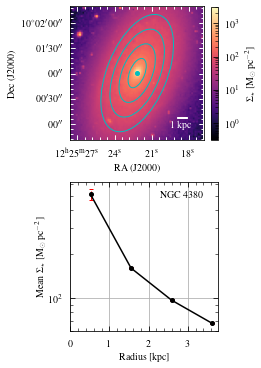

In [4]:
# 
# Plot
#
fig = plt.figure(figsize=mpl.figure.figaspect(1.5))
ax1 = fig.add_subplot(2, 1, 1, projection=nine_arcsec_wcs)
#
# Plot data
#
img1 = ax1.imshow(galaxy_rp.data, cmap="magma", norm=mpl.colors.LogNorm())
cbar1 = fig.colorbar(img1, fraction=0.045)
cbar1.set_label(r"$\rm \Sigma_\star$ [$\rm M_\odot\; pc^{-2}$]")
# Mark centre
ax1.plot(*nine_arcsec_wcs.world_to_pixel(CENTER), "co", markersize=4) 
# Add annuli
pu.add_annuli_old(
    ax1, galaxy_rp.annuli, ls="-", edgecolor="c", fc="None", lw=1, zorder=2
)
# pu.add_annuli_RadialProfile(ax1, galaxy_rp)
# Add scalebar
pu.add_scalebar(ax1, nine_arcsec_wcs, dist=galdist, color="w")
ax1.tick_params(color="w")
ax1.set_xlim(0, galaxy_rp.data.shape[1])
ax1.set_ylim(0, galaxy_rp.data.shape[0])
ax1.set_xlabel("RA (J2000)")
ax1.set_ylabel("Dec (J2000)")
ax1.grid(False)
ax1.set_aspect("equal")
#
ax2 = fig.add_subplot(2, 1, 2)
ebar2 = ax2.errorbar(
    x=galaxy_rp.radii * px_to_kpc,
    y=galaxy_rp.avg_data,
    yerr=galaxy_rp.avg_data_err,  # uncertainty in the mean/median from bootstrapping
    fmt="-o",
    markersize=4,
    color="k",
    ecolor="r",
    elinewidth=1,
    capsize=2,
)
ebar2[-1][0].set_linestyle("--")
# 
# Add name of galaxy
# 
high_i_str = "*" if INCLINATION >= I_THRESHOLD else ""
ax2.text(
    0.9,
    0.9,
    re.sub(r"(\d+)", " \\1", galaxy) + high_i_str,
    c="k",
    ha="right",
    transform=ax2.transAxes,
)
ax2.set_xlabel("Radius [kpc]")
ax2.set_ylabel(
    radial_profile_func.capitalize()
    + r" $\rm \Sigma_\star$ [$\rm M_\odot\; pc^{-2}$]"
)
ax2.semilogy()
ax2.set_xlim(left=0)
#
fig.tight_layout(pad=3.5)
# fig.savefig(galpath + f"{galaxy}_regBin_9as_MLi_radProf_4annuli.pdf")
plt.show()

## Stellar Mass Data (NGVS high resolution)


In [2]:
snr_target = 50  # specifies which voronoi binning file to use
#
# Load data
#
vorbin_results = galpath + f"{galaxy}_vorbin_SNR{snr_target}_ugizBinned.pkl"
with open(vorbin_results, "rb") as f:
    file = dill.load(f)
    gband_signal = file["gband_signal"]
    gband_noise = file["gband_noise"]
    iband_signal = file["iband_signal"]
    iband_noise = file["iband_noise"]
    vorbin_wcs = file["wcs"]
    vorbin_wcs.array_shape = file["wcs_array_shape"]
    px_per_bin = file["px_per_bin"]
#
# Calculate quantities
#
results, errors = fu.MLi_taylor2011(
    gband_signal,
    iband_signal,
    galdist,
    vorbin_wcs,
    gband_err=gband_noise,
    iband_err=iband_noise,
    px_per_bin=px_per_bin,
)
avg_iband_abs_mag, gi_colour, Li, MLi_ratio, M, M_density = results
avg_iband_abs_mag_err, gi_colour_err, Li_err, MLi_ratio_err, M_err, M_density_err = errors
# 
# Galaxy data from Table 1 of Brown et al. (2021)
# 
# Need header of VERTICO data for reference frame. Should be "fk5"
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_Kkms-1.fits"
Ico_data, co_header = fits.getdata(Ico_path, header=True)
# CENTER = coord.SkyCoord(
#     ra="12h25m22.16s", dec="+10d01m00.12s", frame=co_header["RADESYS"].lower()
# )
CENTER = WCS(co_header).pixel_to_world(Ico_data.shape[1] / 2, Ico_data.shape[0] / 2)
INCLINATION = 61  # degrees
PA = 158  # position angle, degrees
I_THRESHOLD = 80  # degrees, INCLINATION >= I_THRESHOLD => high-inclination

In [3]:
# 
# Get worst image quality to use as min_width in radial profile
# 
# Load data
uband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.u.Mg004.3136_8588_6905_10184.fits"
gband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.g.Mg004.3136_8588_6905_10184.fits"
iband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.i.Mg004.3136_8588_6905_10184.fits"
zband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.z.Mg004.3136_8588_6905_10184.fits"
# 
uband_header = fits.getheader(uband_path)
gband_header = fits.getheader(gband_path)
iband_header = fits.getheader(iband_path)
zband_header = fits.getheader(zband_path)
# 
header_order = ["u", "g", "i", "z"]
header_lst = [uband_header, gband_header, iband_header, zband_header]
iqmax, iqmax_idx = fu.get_worst_img_qual(
    header_lst, header_key="IQMAX", header_unit=u.arcsec
)
print("The worst image quality is", iqmax, f"from {header_order[iqmax_idx]}-band data")

The worst image quality is 1.13 arcsec from u-band data


In [4]:
radial_profile_func = "mean"
include_bad = True if INCLINATION < I_THRESHOLD else False
# 
# Initialize RadialProfile object
# 
galaxy_no_rp = RadialProfile(M_density, CENTER, INCLINATION, PA, noise=M_density_err)
# 
# Generate radial profile
# 
galaxy_rp = galaxy_no_rp.calc_radial_profile(
    n_annuli=34,  # use ~40 annuli if matching 5 radio-sized annuli
    min_width=iqmax,
    wcs=vorbin_wcs,
    include_bad=include_bad,
    func=radial_profile_func,
    debug_plot=False,
    is_radio=True,
    bootstrap_errs=True,  # estimates standard error on the mean/median
    n_bootstraps=100,
    bootstrap_seed=3141592654,  # for reproducibility. Does not affect global seed  
)
# 
# Factor to convert radii from pixel units to kpc
# 
px_to_kpc = fu.calc_pc_per_px(vorbin_wcs, galdist)[0][0] / 1000  # assume square pixels

Min width (pixels): 6.082039986066301


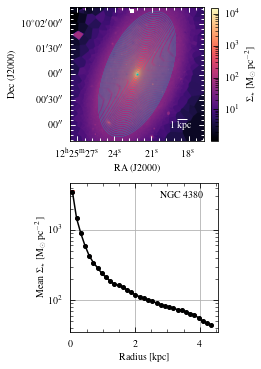

In [5]:
# 
# Plot
#
fig = plt.figure(figsize=mpl.figure.figaspect(1.5))
ax1 = fig.add_subplot(2, 1, 1, projection=vorbin_wcs)
#
# Plot data
#
img1 = ax1.imshow(galaxy_rp.data, cmap="magma", norm=mpl.colors.LogNorm())
cbar1 = fig.colorbar(img1, fraction=0.045)
cbar1.set_label(r"$\rm \Sigma_\star$ [$\rm M_\odot\; pc^{-2}$]")
# Mark centre
ax1.plot(*vorbin_wcs.world_to_pixel(CENTER), "co", markersize=1)
# Add annuli
pu.add_annuli_old(
    ax1, galaxy_rp.annuli, ls="-", edgecolor="c", fc="None", lw=0.25, zorder=2
)
# Add scalebar
pu.add_scalebar(ax1, vorbin_wcs, dist=galdist, color="w")
ax1.tick_params(color="w")
ax1.set_xlim(0, galaxy_rp.data.shape[1])
ax1.set_ylim(0, galaxy_rp.data.shape[0])
ax1.set_xlabel("RA (J2000)")
ax1.set_ylabel("Dec (J2000)")
ax1.grid(False)
ax1.set_aspect("equal")
#
ax2 = fig.add_subplot(2, 1, 2)
ebar2 = ax2.errorbar(
    x=galaxy_rp.radii * px_to_kpc,
    y=galaxy_rp.avg_data,
    yerr=galaxy_rp.avg_data_err,  # uncertainty in the mean/median from bootstrapping
    fmt="-o",
    markersize=4,
    color="k",
    ecolor="r",
    elinewidth=1,
    capsize=2,
)
ebar2[-1][0].set_linestyle("--")
# 
# Add name of galaxy
# 
high_i_str = "*" if INCLINATION >= I_THRESHOLD else ""
ax2.text(
    0.9,
    0.9,
    re.sub(r"(\d+)", " \\1", galaxy) + high_i_str,
    c="k",
    ha="right",
    transform=ax2.transAxes,
)
ax2.set_xlabel("Radius [kpc]")
ax2.set_ylabel(
    radial_profile_func.capitalize()
    + r" $\rm \Sigma_\star$ [$\rm M_\odot\; pc^{-2}$]"
)
ax2.semilogy()
ax2.set_xlim(left=0)
#
fig.tight_layout(pad=3.5)
# fig.savefig(galpath + f"{galaxy}_vorbin_SNR{snr_target}_MLi_radProf_34annuli.pdf")
plt.show()

## u-g Colour


In [2]:
snr_target = 50  # specifies which voronoi binning file to use
#
# Load data
#
vorbin_results = galpath + f"{galaxy}_vorbin_SNR{snr_target}_ugizBinned.pkl"
with open(vorbin_results, "rb") as f:
    file = dill.load(f)
    uband_signal = file["uband_signal"]
    uband_noise = file["uband_noise"]
    gband_signal = file["gband_signal"]
    gband_noise = file["gband_noise"]
    vorbin_wcs = file["wcs"]
    vorbin_wcs.array_shape = file["wcs_array_shape"]
    px_per_bin = file["px_per_bin"]
#
# Calculate u-g colour
#
ug_colour = fu.calc_colour(uband_signal, gband_signal)
ug_colour_err = fu.calc_colour_err(uband_signal, gband_signal, uband_noise, gband_noise)
# 
# Galaxy data from Table 1 of Brown et al. (2021)
# 
# Need header of VERTICO data for reference frame. Should be "fk5"
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_Kkms-1.fits"
Ico_data, co_header = fits.getdata(Ico_path, header=True)
# CENTER = coord.SkyCoord(
#     ra="12h25m22.16s", dec="+10d01m00.12s", frame=co_header["RADESYS"].lower()
# )
CENTER = WCS(co_header).pixel_to_world(Ico_data.shape[1] / 2, Ico_data.shape[0] / 2)
INCLINATION = 61  # degrees
PA = 158  # position angle, degrees
I_THRESHOLD = 80  # degrees, INCLINATION >= I_THRESHOLD => high-inclination

In [3]:
# 
# Get worst image quality to use as min_width in radial profile
# 
# Load data
uband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.u.Mg004.3136_8588_6905_10184.fits"
gband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.g.Mg004.3136_8588_6905_10184.fits"
iband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.i.Mg004.3136_8588_6905_10184.fits"
zband_path = "/arc/home/IsaacCheng/coop_f2021/ngvs_data/NGVS-2-2.l.z.Mg004.3136_8588_6905_10184.fits"
# 
uband_header = fits.getheader(uband_path)
gband_header = fits.getheader(gband_path)
iband_header = fits.getheader(iband_path)
zband_header = fits.getheader(zband_path)
# 
header_order = ["u", "g", "i", "z"]
header_lst = [uband_header, gband_header, iband_header, zband_header]
iqmax, iqmax_idx = fu.get_worst_img_qual(
    header_lst, header_key="IQMAX", header_unit=u.arcsec
)
print("The worst image quality is", iqmax, f"from {header_order[iqmax_idx]}-band data")

The worst image quality is 1.13 arcsec from u-band data


In [8]:
radial_profile_func = "mean"
include_bad = True if INCLINATION < I_THRESHOLD else False
#
# Initialize RadialProfile object
# 
galaxy_no_rp = RadialProfile(ug_colour, CENTER, INCLINATION, PA, noise=ug_colour_err)
# 
# Generate radial profile
# 
galaxy_rp = galaxy_no_rp.calc_radial_profile(
    n_annuli=34,  # use ~40 annuli if matching 5 radio-sized annuli
    min_width=iqmax,
    wcs=vorbin_wcs,
    include_bad=include_bad,
    func=radial_profile_func,
    debug_plot=False,
    is_radio=True,
    bootstrap_errs=True,  # estimates standard error on the mean/median
    n_bootstraps=100,
    bootstrap_seed=3141592654,  # for reproducibility. Does not affect global seed  
)
# 
# Factor to convert radii from pixel units to kpc
# 
px_to_kpc = fu.calc_pc_per_px(vorbin_wcs, galdist)[0][0] / 1000  # assume square pixels

Min width (pixels): 6.082039986066301


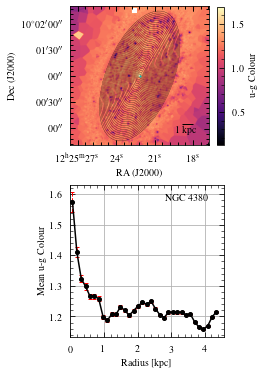

In [9]:
# 
# Plot data
#
fig = plt.figure(figsize=mpl.figure.figaspect(1.5))
ax1 = fig.add_subplot(2, 1, 1, projection=vorbin_wcs)
img1 = ax1.imshow(galaxy_rp.data, cmap="magma")
cbar1 = fig.colorbar(img1, fraction=0.045)
cbar1.set_label("u-g Colour")
# 
# Plot annuli
# 
ax1.plot(*vorbin_wcs.world_to_pixel(CENTER), "co", markersize=1)  # mark centre
# pu.add_annuli_RadialProfile(ax1, galaxy_rp)
pu.add_annuli_old(
    ax1, galaxy_rp.annuli, ls="-", edgecolor="k", fc="None", lw=0.25, zorder=2
)
#
# Add scalebar
#
pu.add_scalebar(ax1, vorbin_wcs, dist=galdist, size_vertical=0.25)
#
# Other parameters
# 
ax1.set_aspect("equal")
ax1.grid(False)
ax1.set_xlabel("RA (J2000)")
ax1.set_ylabel("Dec (J2000)")
ax1.set_xlim(0, galaxy_rp.data.shape[1])
ax1.set_ylim(0, galaxy_rp.data.shape[0])
#
# Plot radial profile
# 
ax2 = fig.add_subplot(2, 1, 2)
ebar2 = ax2.errorbar(
    x=galaxy_rp.radii * px_to_kpc,
    y=galaxy_rp.avg_data,
    yerr=galaxy_rp.avg_data_err,  # uncertainty in the mean/median from bootstrapping
    fmt="-o",
    markersize=4,
    color="k",
    ecolor="r",
    elinewidth=1,
    capsize=2,
)
ebar2[-1][0].set_linestyle("--")
# 
# Add name of galaxy
# 
high_i_str = "*" if INCLINATION >= I_THRESHOLD else ""
ax2.text(
    0.9,
    0.9,
    re.sub(r"(\d+)", " \\1", galaxy) + high_i_str,
    c="k",
    ha="right",
    transform=ax2.transAxes,
)
# 
# Other parameters
# 
ax2.set_xlim(left=0)
ax2.set_xlabel("Radius [kpc]")
ax2.set_ylabel(
    f"{radial_profile_func.capitalize()} u-g Colour"
)
# 
fig.tight_layout(pad=3.25)
# fig.savefig(f"{galaxy}_vorbin_SNR{snr_target}_ugColour_radProf_34annuli.pdf")
plt.show()

### Check that the dip in u-g Colour is real


In [2]:
snr_target = 50  # specifies which voronoi binning file to use
#
# Load data
#
vorbin_results = galpath + f"{galaxy}_vorbin_SNR{snr_target}_ugizBinned.pkl"
with open(vorbin_results, "rb") as f:
    file = dill.load(f)
    uband_signal = file["uband_signal"]
    uband_noise = file["uband_noise"]
    gband_signal = file["gband_signal"]
    gband_noise = file["gband_noise"]
    vorbin_wcs = file["wcs"]
    vorbin_wcs.array_shape = file["wcs_array_shape"]
    px_per_bin = file["px_per_bin"]
#
# Calculate u-g colour
#
ug_colour = fu.calc_colour(uband_signal, gband_signal)
ug_colour_err = fu.calc_colour_err(uband_signal, gband_signal, uband_noise, gband_noise)
# 
# Galaxy data from Table 1 of Brown et al. (2021)
# 
# Need header of VERTICO data for reference frame. Should be "fk5"
Ico_path = f"/arc/home/IsaacCheng/coop_f2021/vertico_data/v1.3/9arcsec/{galaxy}/{galaxy}_7m+tp_co21_pbcorr_9as_round_mom0_Kkms-1.fits"
Ico_data, co_header = fits.getdata(Ico_path, header=True)
# CENTER = coord.SkyCoord(
#     ra="12h25m22.16s", dec="+10d01m00.12s", frame=co_header["RADESYS"].lower()
# )
CENTER = WCS(co_header).pixel_to_world(Ico_data.shape[1] / 2, Ico_data.shape[0] / 2)
INCLINATION = 61  # degrees
PA = 158  # position angle, degrees
I_THRESHOLD = 80  # degrees, INCLINATION >= I_THRESHOLD => high-inclination

In [3]:
# 
# Get worst image quality to use as min_width in radial profile
# 
# Load data
uband_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_u_data.fits"
gband_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_g_data.fits"
iband_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_i_data.fits"
zband_path = f"/arc/home/IsaacCheng/coop_f2021/ngvs_data/{galaxy}/{galaxy}_z_data.fits"
# 
uband_header = fits.getheader(uband_path)
gband_header = fits.getheader(gband_path)
iband_header = fits.getheader(iband_path)
zband_header = fits.getheader(zband_path)
# 
header_order = ["u", "g", "i", "z"]
header_lst = [uband_header, gband_header, iband_header, zband_header]
iqmax, iqmax_idx = fu.get_worst_img_qual(
    header_lst, header_key="IQMAX", header_unit=u.arcsec
)
print("The worst image quality is", iqmax, f"from {header_order[iqmax_idx]}-band data")

The worst image quality is 1.13 arcsec from u-band data


In [4]:
# 
# Randomly generate minimum widths
# 
num_radial_profiles = 50
rng = np.random.default_rng(123456)
min_widths = rng.uniform(low=0.5, high=4, size=num_radial_profiles) * u.arcsec
n_annuli = np.ceil((iqmax / min_widths).value * 34).astype(int)
print(min_widths)
print(n_annuli)

[2.72779812 1.84684083 0.66605897 3.84338459 3.67117828 2.09939344
 1.48186717 2.72652081 3.93248741 3.34351125 1.56819386 2.48803835
 0.5724051  2.50585172 1.94266971 1.70850614 3.05658187 1.48605459
 0.57817061 1.37952384 1.33716026 2.6669983  3.25679462 1.50588429
 1.72122221 3.4370658  0.60448602 0.77397745 2.54694907 1.93911962
 2.61518839 1.8432242  3.58487129 3.02444409 3.30617066 3.90808909
 2.72331895 2.71218907 3.80441848 3.90364369 3.08623927 2.77107575
 1.83202507 0.50818196 2.5527379  3.13040622 1.55465974 3.62105703
 3.57931641 0.90333861] arcsec
[15 21 58 10 11 19 26 15 10 12 25 16 68 16 20 23 13 26 67 28 29 15 12 26
 23 12 64 50 16 20 15 21 11 13 12 10 15 15 11 10 13 14 21 76 16 13 25 11
 11 43]


In [5]:
radial_profile_func = "mean"
include_bad = True if INCLINATION < I_THRESHOLD else False
#
# Initialize RadialProfile object
# 
galaxy_no_rp = RadialProfile(ug_colour, CENTER, INCLINATION, PA, noise=ug_colour_err)
# 
# Generate radial profiles (BE CAREFUL OF MEMORY USAGE!)
# 
rp_results = []
for min_width, n_annulus in zip(min_widths, n_annuli):
    print("Random min width:", min_width)
    print("Number of annuli:", n_annulus)
    galaxy_rp = galaxy_no_rp.calc_radial_profile(
        n_annuli=n_annulus,
        min_width=min_width,
        wcs=vorbin_wcs,
        include_bad=include_bad,
        func=radial_profile_func,
        debug_plot=False,
        is_radio=True,
        bootstrap_errs=True,  # estimates standard error on the mean/median
        n_bootstraps=100,
        bootstrap_seed=3141592654,  # for reproducibility. Does not affect global seed  
    )
    rp_results.append(galaxy_rp)
print("Done radial profiles")
# 
# Factor to convert radii from pixel units to kpc
# 
px_to_kpc = fu.calc_pc_per_px(vorbin_wcs, galdist)[0][0] / 1000  # assume square pixels

Random min width: 2.7277981245062577 arcsec
Number of annuli: 15
Min width (pixels): 14.681926785100638
Random min width: 1.8468408271100132 arcsec
Number of annuli: 21
Min width (pixels): 9.940318370250319
Random min width: 0.6660589749944461 arcsec
Number of annuli: 58
Min width (pixels): 3.5849533796412
Random min width: 3.8433845886552365 arcsec
Number of annuli: 10
Min width (pixels): 20.686388274364717
Random min width: 3.6711782781109337 arcsec
Number of annuli: 11
Min width (pixels): 19.759516003051974
Random min width: 2.099393441988675 arcsec
Number of annuli: 19
Min width (pixels): 11.299641469611048
Random min width: 1.481867166573573 arcsec
Number of annuli: 26
Min width (pixels): 7.975907399238268
Random min width: 2.7265208122341655 arcsec
Number of annuli: 15
Min width (pixels): 14.675051860929349
Random min width: 3.9324874131268026 arcsec
Number of annuli: 10
Min width (pixels): 21.165969638353666
Random min width: 3.343511252128001 arcsec
Number of annuli: 12
Min wid

In [ ]:
# 
# Save results (be careful of memory usage!)
# 
ug_rp_outfile = galpath + f"{galaxy}_vorbin_SNR{snr_target}_ugColour_{num_radial_profiles}radProfs.pkl"
with open(ug_rp_outfile, "wb") as f:
    dill.dump(
        {
            "num_radial_profiles": num_radial_profiles,
            "IQMAX": iqmax,
            "min_widths": min_widths,
            "n_annuli": n_annuli,
            "px_to_kpc": px_to_kpc,
            "rp_results": rp_results,
        },
        f,
    )
print("Pickled", ug_rp_outfile)

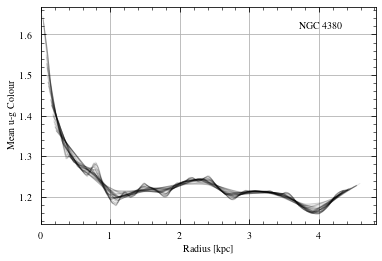

In [8]:
import re
#
# Plot radial profile
# 
fig, ax = plt.subplots()
for rp_result in rp_results:
    ebar = ax.errorbar(
        x=rp_result.radii * px_to_kpc,
        y=rp_result.avg_data,
    #     yerr=galaxy_rp.avg_data_err,  # uncertainty in the mean/median from bootstrapping
        fmt="-",
        color="k",
        alpha=0.1,
        lw=1,
    #     ecolor="r",
    #     elinewidth=1,
    #     capsize=2,
    )
# ebar2[-1][0].set_linestyle("--")
# 
# Add name of galaxy
# 
high_i_str = "*" if INCLINATION >= I_THRESHOLD else ""
ax.text(
    0.9,
    0.9,
    re.sub(r"(\d+)", " \\1", galaxy) + high_i_str,
    c="k",
    ha="right",
    transform=ax.transAxes,
)
# 
# Other parameters
# 
ax.set_xlim(left=0)
ax.set_xlabel("Radius [kpc]")
ax.set_ylabel(
    f"{radial_profile_func.capitalize()} u-g Colour"
)
# fig.savefig(f"{galaxy}_vorbin_SNR{snr_target}_ugColour_{num_radial_profiles}radProfs.pdf")
plt.show()

## Gas Fraction


In [2]:
# 
# Load data
# 
gas_fraction_infile = galpath + f"{galaxy}_regBin_TaylorMLi_gasFrac_9as.pkl"
with open(gas_fraction_infile, "rb") as f:
    file = dill.load(f)
    gas_fraction = file["gas_fraction"]
    gas_fraction_err = file["gas_fraction_err"]
    co_header = file["co_header"]
    co_wcs = file["wcs_binned"]
    co_wcs.array_shape = file["wcs_binned_array_shape"]
    print(file["note"])

Molecular gas density is corrected for inclination, stellar mass density estimated using Taylor+2011 prescription


In [3]:
# 
# Radial Profile
# 
# CENTER = coord.SkyCoord(
#     ra="12h25m22.16s", dec="+10d01m00.12s", frame=co_header["RADESYS"].lower()
# )
CENTER = co_wcs.pixel_to_world(gas_fraction.shape[1] / 2, gas_fraction.shape[0] / 2)
INCLINATION = 61  # degrees
PA = 158  # position angle, degrees
I_THRESHOLD = 80  # degrees, INCLINATION >= I_THRESHOLD => high-inclination
radial_profile_func = "mean"
include_bad = True if INCLINATION < I_THRESHOLD else False
# 
# Initialize RadialProfile object
# 
galaxy_no_rp = RadialProfile(
    gas_fraction, CENTER, INCLINATION, PA, noise=gas_fraction_err
)
# 
# Generate radial profile
# 
galaxy_rp = galaxy_no_rp.calc_radial_profile(
    n_annuli=4,  # to match with VERTICO molecular gas radial profile
    # snr_cutoff=0,  # requires image to be background subtracted (i.e., with zeros/NaNs)
    header=co_header,
    include_bad=include_bad,
    func=radial_profile_func,
    debug_plot=False,
    is_radio=True,  # just to set beam size as minimum width
    bootstrap_errs=True,  # estimates standard error on the mean/median
    n_bootstraps=100,
    bootstrap_seed=3141592654,  # for reproducibility. Does not affect global seed  
)
# 
# Factor to convert radii from pixel units to kpc
# 
px_to_kpc = fu.calc_pc_per_px(co_wcs, galdist)[0][0] / 1000  # assume square pixels


Getting minimum width from radio beam size
Min width/beam size (pixels): 4.50000000014364


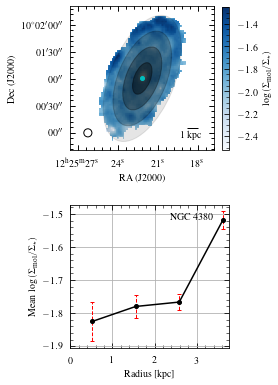

In [6]:
# 
# Plot
#
fig = plt.figure(figsize=mpl.figure.figaspect(1.6))
ax1 = fig.add_subplot(2, 1, 1, projection=co_wcs)
#
# Plot data
#
img1 = ax1.imshow(galaxy_rp.data, cmap="Blues")
cbar1 = fig.colorbar(img1, fraction=0.045)
cbar1.set_label(r"$\rm \log\left(\Sigma_{mol} / \rm \Sigma_{\star}\right)$")
# Mark centre
ax1.plot(*co_wcs.world_to_pixel(CENTER), "co", markersize=4)
# Add annuli
pu.add_annuli_RadialProfile(ax1, galaxy_rp, alpha_coeff=0.4)
# Add scalebar
pu.add_scalebar(ax1, co_wcs, dist=galdist)
pu.add_scalebeam(ax1, co_header)
ax1.set_xlim(0, galaxy_rp.data.shape[1])
ax1.set_ylim(0, galaxy_rp.data.shape[0])
ax1.set_xlabel("RA (J2000)")
ax1.set_ylabel("Dec (J2000)")
ax1.grid(False)
ax1.set_aspect("equal")
#
ax2 = fig.add_subplot(2, 1, 2)
ebar2 = ax2.errorbar(
    x=galaxy_rp.radii * px_to_kpc,
    y=galaxy_rp.avg_data,
    yerr=galaxy_rp.avg_data_err,  # uncertainty in the mean/median from bootstrapping
    fmt="-o",
    markersize=4,
    color="k",
    ecolor="r",
    elinewidth=1,
    capsize=2,
)
ebar2[-1][0].set_linestyle("--")
# 
# Add name of galaxy
# 
high_i_str = "*" if INCLINATION >= I_THRESHOLD else ""
ax2.text(
    0.9,
    0.9,
    re.sub(r"(\d+)", " \\1", galaxy) + high_i_str,
    c="k",
    ha="right",
    transform=ax2.transAxes,
)
ax2.set_xlabel("Radius [kpc]")
ax2.set_ylabel(
    radial_profile_func.capitalize()
    + r" $\rm \log\left(\Sigma_{mol} / \rm \Sigma_{\star}\right)$"
)
ax2.set_xlim(left=0)
pu.set_aspect(ax2, 0.9, logx=False, logy=False)
#
fig.tight_layout(pad=3.5)
# fig.savefig(galpath + f"{galaxy}_gas_fraction_radProf_4annuli.pdf")
plt.show()

# Determine any limits in creating our own MLCR


## u-i vs. g-z showing 9" beam with 2"-bins and Voronoi-binned datasets

Goal: find if there are pixels in the high-res image that have no counterpart in the 9"
beam with 2" pixels image


In [1]:
# Need to switch directories if using VS Code + sshfs
galaxy = "NGC4380"
galpath = f"/arc/home/IsaacCheng/coop_f2021/galaxies/{galaxy}/"
%cd "$galpath"
# 
import astropy.coordinates as coord
import astropy.units as u
import dill
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from astropy.io import fits
from astropy.wcs import WCS
from scipy.stats import gaussian_kde
# 
# Load my own packages
# 
import sys
sys.path.append("/arc/home/IsaacCheng/coop_f2021/packages")
import fits_utils as fu
import plot_utils as pu
import radial_profile_utils as rpu
from radial_profile import RadialProfile
# Reload my packages
import importlib
importlib.reload(fu)
importlib.reload(pu)
importlib.reload(rpu)
# 
galdist = 16.5 * u.Mpc  # distance to centre of Virgo cluster. Assume 10% uncertainty

/arc/home/IsaacCheng/coop_f2021/galaxies/NGC4380


In [2]:
snr_target = 50  # specifies which Voronoi-binning file to use
#
# Load 9 arcsec beam. 2 arcsec px resolution optical data
#
uband_infile = galpath + f"{galaxy}_regBin_uband_9as.pkl"
with open(uband_infile, "rb") as f:
    file = dill.load(f)
    uband_signal_9as = file["signal_binned"]
    uband_noise_9as = file["noise_binned"]
gband_infile = galpath + f"{galaxy}_regBin_gband_9as.pkl"
with open(gband_infile, "rb") as f:
    file = dill.load(f)
    gband_signal_9as = file["signal_binned"]
    gband_noise_9as = file["noise_binned"]
iband_infile = galpath + f"{galaxy}_regBin_iband_9as.pkl"
with open(iband_infile, "rb") as f:
    file = dill.load(f)
    iband_signal_9as = file["signal_binned"]
    iband_noise_9as = file["noise_binned"]
zband_infile = galpath + f"{galaxy}_regBin_zband_9as.pkl"
with open(zband_infile, "rb") as f:
    file = dill.load(f)
    zband_signal_9as = file["signal_binned"]
    zband_noise_9as = file["noise_binned"]
#
# Load Voronoi-binned data
#
vorbin_results = galpath + f"{galaxy}_vorbin_SNR{snr_target}_ugizBinned.pkl"
with open(vorbin_results, "rb") as f:
    file = dill.load(f)
    uband_signal_vorbin = file["uband_signal"]
    uband_noise_vorbin = file["uband_noise"]
    gband_signal_vorbin = file["gband_signal"]
    gband_noise_vorbin = file["gband_noise"]
    iband_signal_vorbin = file["iband_signal"]
    iband_noise_vorbin = file["iband_noise"]
    zband_signal_vorbin = file["zband_signal"]
    zband_noise_vorbin = file["zband_noise"]


In [3]:
# 
# Mask for removing bad data (required for KDE)
# 
isgood_vorbin = (
    np.isfinite(uband_signal_vorbin)
    & np.isfinite(gband_signal_vorbin)
    & np.isfinite(iband_signal_vorbin)
    & np.isfinite(zband_signal_vorbin)
)
# 
# Calculate colours
# 
ui_colour_9as = fu.calc_colour(uband_signal_9as, iband_signal_9as)
ui_colour_vorbin = fu.calc_colour(uband_signal_vorbin, iband_signal_vorbin)
gz_colour_9as = fu.calc_colour(gband_signal_9as, zband_signal_9as)
gz_colour_vorbin = fu.calc_colour(gband_signal_vorbin, zband_signal_vorbin)
# 
# Remove infs and NaNs (for KDE)
# 
ui_colour_vorbin = ui_colour_vorbin[isgood_vorbin]
gz_colour_vorbin = gz_colour_vorbin[isgood_vorbin]

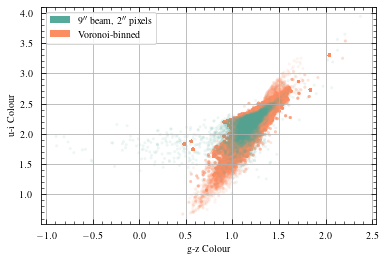

In [4]:
#
# Scatter plot
#
# contour_colour_9as = sns.color_palette("colorblind").as_hex()[0]
# contour_colour_vorbin = sns.color_palette("colorblind").as_hex()[2]
plot_colour_9as = "#5A9"
plot_colour_vorbin = "C1"
#
fig, ax = plt.subplots()
ax.scatter(
    gz_colour_vorbin.flatten(),
    ui_colour_vorbin.flatten(),
    color=plot_colour_vorbin,
    marker=".",
    edgecolors="none",
    alpha=0.1,
)
ax.scatter(
    gz_colour_9as.flatten(),
    ui_colour_9as.flatten(),
    color=plot_colour_9as,
    marker=".",
    edgecolors="none",
    alpha=0.1,
)
#
# Add labels (alpha too low)
#
label_9as_plot = mpl.patches.Circle(
    (0, 0), 0, fc=plot_colour_9as, label="9$''$ beam, 2$''$ pixels"
)
label_vorbin_plot = mpl.patches.Circle(
    (0, 0), 0, fc=plot_colour_vorbin, label="Voronoi-binned"
)
ax.patches += [label_9as_plot]
ax.patches += [label_vorbin_plot]
ax.legend(loc="upper left")
ax.set_xlabel("g-z Colour")
ax.set_ylabel("u-i Colour")
# fig.savefig(
#     galpath + f"{galaxy}_ui_vs_gz_scatter.png", facecolor="w", transparent=False, dpi=300
# )  # PDF would be very large!
plt.show()


In [5]:
# 
# Calculate quantities for KDE
# 
xvals_9as = np.linspace(np.nanmin(gz_colour_9as), np.nanmax(gz_colour_9as), 100)
yvals_9as = np.linspace(np.nanmin(ui_colour_9as), np.nanmax(ui_colour_9as), 100)
xmesh_9as, ymesh_9as = np.meshgrid(xvals_9as, yvals_9as)
xvals_vorbin = np.linspace(np.nanmin(gz_colour_vorbin), np.nanmax(gz_colour_vorbin), 100)
yvals_vorbin = np.linspace(np.nanmin(ui_colour_vorbin), np.nanmax(ui_colour_vorbin), 100)
xmesh_vorbin, ymesh_vorbin = np.meshgrid(xvals_vorbin, yvals_vorbin)
# 
colour_data_9as = np.vstack((gz_colour_9as.flatten(), ui_colour_9as.flatten()))
colour_data_vorbin = np.vstack((gz_colour_vorbin, ui_colour_vorbin))
# 
positions_9as = np.vstack((xmesh_9as.flatten(), ymesh_9as.flatten()))
positions_vorbin = np.vstack((xmesh_vorbin.flatten(), ymesh_vorbin.flatten()))
# 
# Fit KDE
# 
colour_kde_9as = gaussian_kde(colour_data_9as)
colour_kde_vorbin = gaussian_kde(colour_data_vorbin)

In [6]:
# 
# Evaluate KDE at positions
# 
colour_kde_vals_9as_orig = colour_kde_9as(positions_9as)
colour_kde_vals_vorbin_orig = colour_kde_vorbin(positions_vorbin)

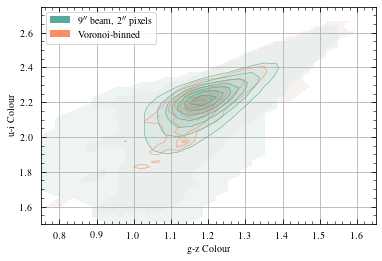

In [7]:
# 
# KDE contour plot
# 
# contour_colour_9as = sns.color_palette("colorblind").as_hex()[5]
# contour_colour_vorbin = sns.color_palette("colorblind").as_hex()[2]
contour_colour_9as = "#5A9"
contour_colour_vorbin = "C1"
contour_cmap_9as = sns.color_palette("light:" + contour_colour_9as, as_cmap=True)
contour_cmap_vorbin = sns.color_palette("light:" + contour_colour_vorbin, as_cmap=True)
#
# Mask background
#
colour_kde_vals_9as = np.copy(colour_kde_vals_9as_orig.reshape(xmesh_9as.shape))
colour_kde_vals_vorbin = np.copy(colour_kde_vals_vorbin_orig.reshape(xmesh_vorbin.shape))
colour_kde_vals_9as[colour_kde_vals_9as <= 0.1] = np.nan
colour_kde_vals_vorbin[colour_kde_vals_vorbin <= 0.1] = np.nan
#
# Plot
#
fig, ax = plt.subplots()
ax.contourf(
    xvals_vorbin,
    yvals_vorbin,
    colour_kde_vals_vorbin,
    cmap=contour_cmap_vorbin,
    alpha=0.6,
)
ax.contourf(xvals_9as, yvals_9as, colour_kde_vals_9as, cmap=contour_cmap_9as, alpha=0.6)
ax.contour(
    xvals_vorbin,
    yvals_vorbin,
    colour_kde_vals_vorbin,
    colors=contour_colour_vorbin,
    linewidths=0.5,
    alpha=1,
)
ax.contour(
    xvals_9as,
    yvals_9as,
    colour_kde_vals_9as,
    colors=contour_colour_9as,
    linewidths=0.5,
    alpha=1,
)
ax.set_xlim(0.75, 1.65)
ax.set_ylim(1.5, 2.75)
#
# Add legend
#
label_9as_plot = mpl.patches.Rectangle(
    (0, 0), 0, 0, fc=contour_colour_9as, label="9$''$ beam, 2$''$ pixels"
)
label_vorbin_plot = mpl.patches.Rectangle(
    (0, 0), 0, 0, fc=contour_colour_vorbin, label="Voronoi-binned"
)
ax.patches += [label_9as_plot]
ax.patches += [label_vorbin_plot]
ax.legend(loc="upper left")
ax.set_xlabel("g-z Colour")
ax.set_ylabel("u-i Colour")
# fig.savefig(galpath + f"{galaxy}_ui_vs_gz_contour.pdf")
plt.show()
